In [8]:
# from jupyterthemes import jtplot
# jtplot.style(theme="grade3")

In [1]:
import pandas as pd
import numpy as np
import csv
from PIL import Image

import matplotlib.pyplot as plt

from scipy.signal import argrelextrema

import matplotlib.pyplot as plt
import matplotlib
from matplotlib import rcParams

import math
from pyproj import CRS
from pyproj import Transformer
import geopandas as gpd
import sklearn
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from shapely.geometry import Point, Polygon, LineString, MultiPoint, MultiPolygon, MultiLineString
from shapely.ops import split, linemerge, unary_union, polygonize
import geopandas as gpd
from sklearn import mixture

# Load data

The first step of framework is to load the data and clean it up.

In [3]:
data_path = "competition_dataset.csv" # define path to dataset

Reshape the data and generate a new csv file for subsequent processing

In [4]:
def getElement(row):
    """Split each line of string based on the semicolon, and return
    the value before and after the semicolon"""
    try:
        indexSep = row.index(";")
        return row[:indexSep], row[indexSep + 2 :]
    except ValueError:
        return row[:-1], row[-1]


with open(r"competition_dataset.csv") as sample:
    with open(r"reshape_dataset.csv", "a") as ReData:
        row = sample.readline()  # Remove the column name in the first row
        columns = [None] * 10
        for i in range(10):
            columns[i], row = getElement(row)
        print(*columns, sep=",", file=ReData)
        while 1:
            row = sample.readline()
            if not row:
                break
            key = [None] * 4
            value = [None] * 6
            for i in range(4):
                key[i], row = getElement(row)  # row = row[indexSep +2 :]
            while 1:
                for i in range(6):
                    value[i], row = getElement(row)
                print(*key, *value, sep=",", file=ReData)
                if row == "\n":  # break condition
                    break

The following methods loads the dataset into two pandas dataframe: The first contains aggregate vehicle data, or metadata; the second contains trajectory information.

In [5]:
def read_csv(path):
    metadata_cols = ['track_id', 'type', 'traveled_d', 'avg_speed']
    data_cols = ['lat', 'lon', 'speed', 'lat_acc', 'lon_acc', 'time', 'track_id']
    
    # need track_id to match
    metadata_colsize = len(metadata_cols)
    data_colsize = len(data_cols)-1
    
    metadata_rows = list()
    data_rows = list()
    
    with open(path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=';')
        next(csv_reader)
        metadata = dict()
        for row in csv_reader:
            row = [item.strip() for item in row]
            track_id = int(row[0])
            metadata_rows.append(row[:metadata_colsize])

            data_traj = [float(item) for item in row[metadata_colsize:]
                         if len(item) > 0]
            for i in range(0, len(data_traj), data_colsize):
                data_row = data_traj[i:i+data_colsize] + [track_id]
                data_rows.append(data_row)
    data = pd.DataFrame(data_rows, columns=data_cols)
    metadata = pd.DataFrame(metadata_rows, columns=metadata_cols)
    metadata = metadata.set_index('track_id')
    metadata.index = metadata.index.astype(int)
    return metadata, data

In [6]:
metadata, data = read_csv(data_path)

# Trajectory visualization

We can see that the dataframe key is just a sequence of numbers. A more informative key would be better. A trajectory is uniquely labeled by `track_id` and the snapshot in time is uniquely labeled by `time`. The id-time pair therefore uniquely identifies each datapoint. We therefore use these two columns to reindex the dataframe.

We would rather work with integer values for indexing, so we convert `time` to an integer. We note that it appears that the time values increment in steps of 1/25, where we assume 25 is the frame rate.

In [7]:
fps = 25
max(abs(round(fps*data['time'])-fps*data['time']))

1.8189894035458565e-12

In [8]:
data['frame'] = round(fps*data['time']).astype(int)
data.set_index(['track_id','frame'],drop=True,inplace=True)

Here's what the data frame looks like now:

In [9]:
data.head()

lat        lon    speed  lat_acc  lon_acc  time
track_id frame                                                       
1        0      37.991016  23.735396  12.4578  -0.0633   0.0169  0.00
         1      37.991016  23.735397  12.4544   0.0154   0.0193  0.04
         2      37.991016  23.735399  12.4601   0.0638   0.0215  0.08
         3      37.991016  23.735400  12.4727   0.1122   0.0238  0.12
         4      37.991015  23.735402  12.4957   0.2060   0.0259  0.16

The lat-lon values are cumbersome to work with as they have high precision, but their range is small. To reduce scale, we begin by computing the bounding box of the spatial coordinates.

In [10]:
lat0 = data['lat'].min()
lat1 = data['lat'].max()
dlat = lat1-lat0

lon0 = data['lon'].min()
lon1 = data['lon'].max()
dlon = lon1-lon0

Note that, since the Earth is locally flat, we can treat longitude and latitude as locally Euclidean coordinates. We can see from the data that the accuracy of the measurements is to the 6th significant digit:

In [11]:
print([lat0, lon0, lat1, lon1])

[37.989523, 23.730278, 37.99281, 23.736517]


To confirm out flatness hypothesis, we determine the coordinates of the box bounds in a locally flat frame. The formulas for this are found on the Great Circle Calculator at http://edwilliams.org/avform.htm.

In [12]:
a = 6378.137          # equitorial radius from WGS84 model in km
f = 1./298.257223563  # spheroid flattening factor from WGS84 model

e2 = f*(2-f)          # eccentricity squared

sin_lat0 = np.sin(np.deg2rad(lat0))
cos_lat0 = np.cos(np.deg2rad(lat0))
n = np.sqrt(1 - e2*sin_lat0**2)

R1 = (1-e2) * a / n**3
R2 = a / n

dN = R1 * np.deg2rad(dlat)
dE = R2 * cos_lat0 * np.deg2rad(dlon)

We check the diagonal distance obtained using the flatness assumption against the actual, great-circle distance given by the Great Circle Calculator, which is 658.387m.

In [13]:
true_diag = 658.387
flat_diag = 1e3*np.sqrt(dN**2 + dE**2)
print(round(flat_diag-true_diag,3)) # print error to 3 significant digits

0.01


The error given by the flatness approximation is no more than 1cm, and therefore negligible.

We define a new method that transforms lat-lon into one-millionth lat-lon units and use this to define two new `N` and `E` columns in the dataframe.

In [14]:
def convLL(LLcol,scale,LL0):
    return (scale*(LLcol-LL0)).apply(round).astype(int)

scale = 1e6

In [15]:
data['N'] = convLL(data['lat'],scale=scale,LL0=lat0)
data['E'] = convLL(data['lon'],scale=scale,LL0=lon0)

Here's what the dataframe looks like now.

In [16]:
data.head()

lat        lon    speed  lat_acc  lon_acc  time     N  \
track_id frame                                                                
1        0      37.991016  23.735396  12.4578  -0.0633   0.0169  0.00  1493   
         1      37.991016  23.735397  12.4544   0.0154   0.0193  0.04  1493   
         2      37.991016  23.735399  12.4601   0.0638   0.0215  0.08  1493   
         3      37.991016  23.735400  12.4727   0.1122   0.0238  0.12  1493   
         4      37.991015  23.735402  12.4957   0.2060   0.0259  0.16  1492   

                   E  
track_id frame        
1        0      5118  
         1      5119  
         2      5121  
         3      5122  
         4      5124

We will be working with image-based data, so we create a method to convert the data into an image. The first image we create will be a black and white image of all traffic trajectories at the highest resolution. The image shows all traffic over the entire monitoring period. Each pixel's intensity is proportional to the number of times a vehicle's position occupied that point, with white representing the highest intensity. We saturate the intensity according to the parameter `sat_count` which we set at a default of $10$.

In [17]:
Nrange = data['N'].max()+1
Erange = data['E'].max()+1

In [18]:
def create_traffic_heatmap(pos,sat_count=10,min_count=1):    
    img_array = np.zeros((Nrange,Erange))     # initalize image array
    
    uniques = pos.value_counts()                      # find unique values and apply to array
    img_array[tuple(np.asarray(tuple(uniques.index)).T)] = uniques.values
    img_array[img_array < min_count] = 0
        
    img_array = np.clip(img_array,0,sat_count) / sat_count        # scale and saturate
    
    im = Image.fromarray(np.uint8(np.flipud(img_array)*255),'L')  # create image from array
    
    return im, img_array

In [19]:
im_baseline, im_baseline_array = create_traffic_heatmap(data[['N','E']],sat_count=3,min_count=2)

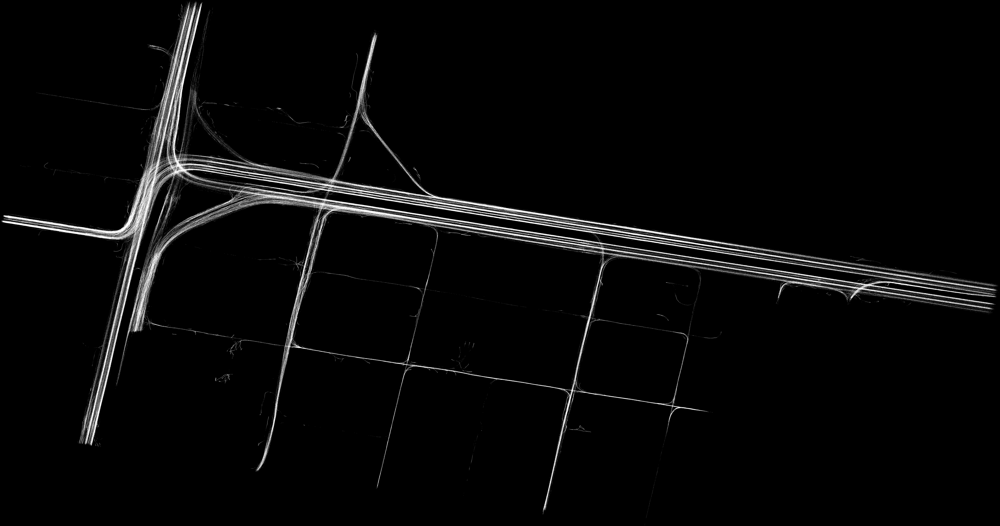

In [20]:
display(im_baseline)

The image clearly shows the trajectories of vehicles.

# Import the reshaped data and set the coordinate reference system

In [21]:
def import_reshapedata(path1, EPSG=2100):
    or_data = pd.read_csv(path1)
    crs1 = CRS.from_epsg(4326)
    crs2 = CRS.from_epsg(EPSG)
    transformer = Transformer.from_crs(crs1, crs2)
    or_data["x"], or_data["y"] = transformer.transform(
        or_data["lat"].values, or_data["lon"].values
    )
    return or_data


or_data = import_reshapedata("/Users/ove/Downloads/Results-master/Codes/Team 7 ZJUI/reshape_dataset.csv")
or_data.head()

,track_id,type,traveled_d,avg_speed,lat,lon,speed,lon_acc,lat_acc,time,x,y
0,1,Car,16.7,15.820474,37.991016,23.735396,12.4578,-0.0633,0.0169,0.00,476615.946365,4.204563e+06
1,1,Car,16.7,15.820474,37.991016,23.735397,12.4544,0.0154,0.0193,0.04,476616.034174,4.204563e+06
2,1,Car,16.7,15.820474,37.991016,23.735399,12.4601,0.0638,0.0215,0.08,476616.209791,4.204563e+06
3,1,Car,16.7,15.820474,37.991016,23.735400,12.4727,0.1122,0.0238,0.12,476616.297600,4.204563e+06
4,1,Car,16.7,15.820474,37.991015,23.735402,12.4957,0.2060,0.0259,0.16,476616.472902,4.204563e+06


## Separate data from three areas of interest

In [22]:
def extract_Zone(df_concat, PolygonR, polygonY, PolygonG):

    df_concat_m = gpd.GeoDataFrame(
        df_concat,
        geometry=gpd.points_from_xy(df_concat.lon, df_concat.lat),
        crs="EPSG:4326",
    )
    points_red = df_concat_m["geometry"].within(PolygonR)
    df_red = df_concat_m[points_red]
    df_yellow = df_concat_m[df_concat_m["geometry"].within(polygonY)]
    df_green = df_concat_m[df_concat_m["geometry"].within(PolygonG)]

    return df_red, df_yellow, df_green

In [23]:
polygonR = Polygon(
    [
        (23.731513, 37.991733),
        (23.731551, 37.991848),
        (23.735570, 37.991181),
        (23.735552, 37.991085),
    ]
)
polygonY = Polygon(
    [
        (23.732146, 37.991627),
        (23.732113, 37.991508),
        (23.731443, 37.991330),
        (23.731318, 37.991226),
        (23.731292, 37.991123),
        (23.731146, 37.991142),
        (23.731364, 37.991468),
        (23.731791, 37.991686),
    ]
)
polygonG = Polygon(
    [
        (23.731395, 37.991880),
        (23.731179, 37.991899),
        (23.731424, 37.992846),
        (23.731588, 37.992813),
    ]
)
df_red, df_yellow, df_green = extract_Zone(or_data, polygonR, polygonY, polygonG)

### Show the images of interest area

Text(0.5, 1.0, 'Data separated by research area ')

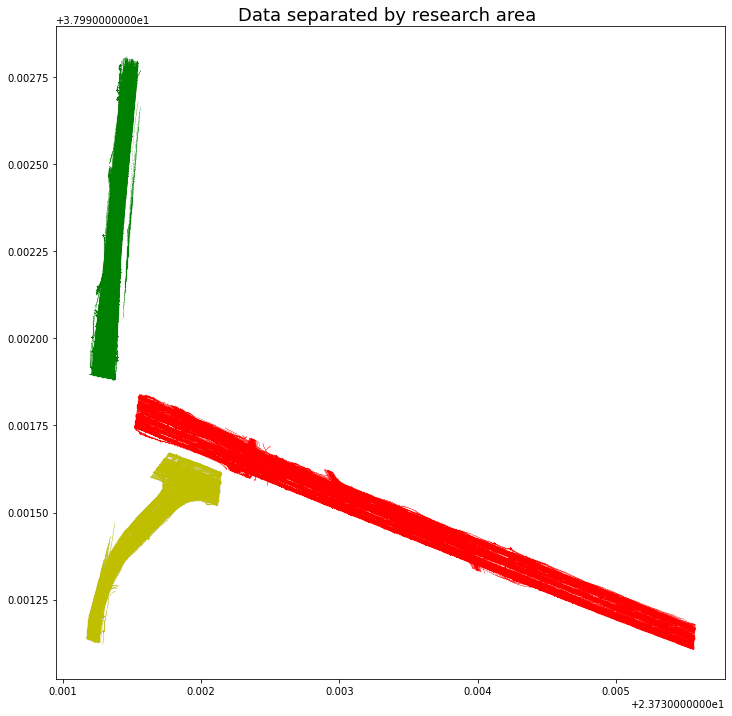

In [24]:
fig, ax = plt.subplots(figsize=(12, 12))
ax.scatter(df_red.lon, df_red.lat, color="r", s=0.005)
ax.scatter(df_green.lon, df_green.lat, color="g", s=0.005)
ax.scatter(df_yellow.lon, df_yellow.lat, color="y", s=0.005)

plt.grid(False)
plt.title("Data separated by research area ", fontdict={"fontsize": 18})

### Remove data with wrong direction

In [25]:
def filtereddatabydirection(df):
    data_1 = df[["track_id", "x", "y"]].drop_duplicates("track_id", keep="first")
    data_2 = df[["track_id", "x", "y"]].drop_duplicates("track_id", keep="last")
    data = pd.merge(data_1, data_2, on="track_id", suffixes=("_1", "_2"))
    data.query("x_2-x_1!=0", inplace=True)
    data.eval(
        """
     a = (y_2-y_1)/(x_2-x_1)""",
        inplace=True,
    )
    track_id = data.query("a<0").track_id
    return df.query("track_id in @track_id")


df_red = filtereddatabydirection(df_red)
df_red.head()

,track_id,type,traveled_d,avg_speed,lat,lon,speed,lon_acc,lat_acc,time,x,y,geometry
132691,87,Car,138.83,12.072509,37.99174,23.731584,0.0,0.0,0.0,0.00,476281.4512,4.204645e+06,POINT (23.73158 37.99174)
132692,87,Car,138.83,12.072509,37.99174,23.731584,0.0,0.0,0.0,0.04,476281.4512,4.204645e+06,POINT (23.73158 37.99174)
132693,87,Car,138.83,12.072509,37.99174,23.731584,0.0,0.0,0.0,0.08,476281.4512,4.204645e+06,POINT (23.73158 37.99174)
132694,87,Car,138.83,12.072509,37.99174,23.731584,0.0,0.0,0.0,0.12,476281.4512,4.204645e+06,POINT (23.73158 37.99174)
132695,87,Car,138.83,12.072509,37.99174,23.731584,0.0,0.0,0.0,0.16,476281.4512,4.204645e+06,POINT (23.73158 37.99174)


### Separate data with long road segments based on intersections

In [26]:
def get_linesegments(line, n):
    points = MultiPoint([line.interpolate(i / n, normalized=True) for i in range(1, n)])
    return line.difference(points.buffer(1e-13))


def get_stopped(df):
    stopv = df[df["speed"] <= 0.01]
    # stopv_m = gpd.GeoDataFrame(stopv, geometry=gpd.points_from_xy(stopv.lon, stopv.lat))
    # stopv_m.crs = {'init': 'epsg:4326'}

    return stopv


def extract_intersection(df_red, polygonR):
    roadLineR = LineString([(23.731513, 37.991733), (23.735552, 37.991085)])
    roadLineR_seg = get_linesegments(roadLineR, 35)

    perline_C_list = []
    for i in range(len(roadLineR_seg) - 1):
        left = roadLineR_seg[i].parallel_offset(0.01, "left")
        right = roadLineR_seg[i].parallel_offset(0.01, "right")
        c = left.boundary[1]
        d = right.boundary[0]
        perline = LineString([d, c])
        perline_C_list.append(perline)
    perline_C = MultiLineString(perline_C_list)

    pa = []
    perline_C_list.append(polygonR.boundary)
    borders = unary_union(perline_C_list)
    polygons = polygonize(borders)
    for p in polygons:
        pa.append(p)

    pag = gpd.GeoSeries(pa)
    temp = pag[1]
    pag[1] = pag[0]
    pag[0] = temp

    return pag

In [27]:
def show_stops_segment(df_red, pag):
    # calculate the
    stopv_m = get_stopped(df_red)
    number_pag = len(pag)
    number_in_pag = np.zeros(number_pag)
    for i in range(number_pag):
        points_red_seg = stopv_m["geometry"].within(pag[i])
        number_in_pag[i] = stopv_m[points_red_seg].count()["track_id"]
    plt.figure(figsize=(10, 6))
    plt.plot(number_in_pag, marker="o")

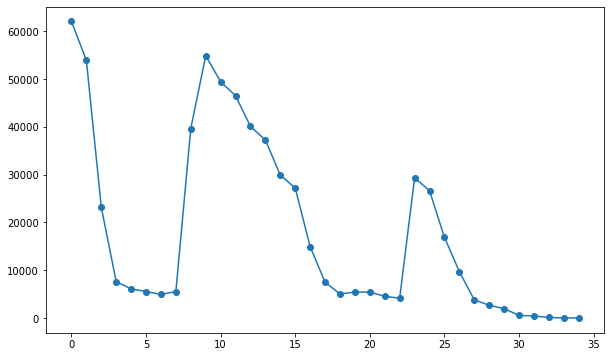

In [28]:
pag = extract_intersection(df_red,polygonR)
show_stops_segment(df_red,pag)

In [29]:
def get_intersection_data(df_red, pag):
    polygonR1 = Polygon(
        [
            pag[0].exterior.coords[2],
            pag[0].exterior.coords[3],
            pag[7].exterior.coords[2],
            pag[7].exterior.coords[3],
        ]
    )
    points_R1 = df_red["geometry"].within(polygonR1)
    df_r1 = df_red[points_R1]

    polygonR2 = Polygon(
        [
            pag[8].exterior.coords[0],
            pag[8].exterior.coords[1],
            pag[22].exterior.coords[2],
            pag[22].exterior.coords[3],
        ]
    )
    points_R2 = df_red["geometry"].within(polygonR2)
    df_r2 = df_red[points_R2]

    polygonR3 = Polygon(
        [
            pag[23].exterior.coords[0],
            pag[23].exterior.coords[1],
            pag[34].exterior.coords[2],
            pag[34].exterior.coords[3],
        ]
    )
    points_R3 = df_red["geometry"].within(polygonR3)
    df_r3 = df_red[points_R3]

    return df_r1, df_r2, df_r3

In [30]:
df_r1, df_r2, df_r3 = get_intersection_data(df_red, pag)

### Visualization

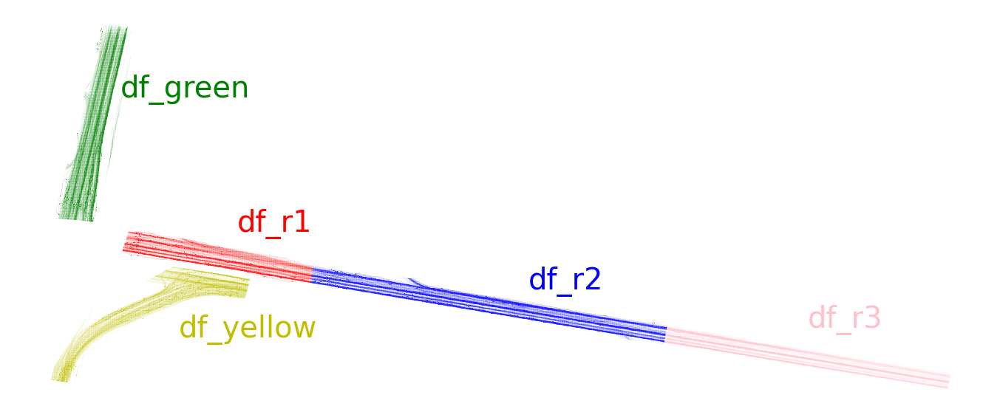

In [31]:
fig, ax = plt.subplots(figsize=(24, 10))
x_y = df_yellow.x
y_y = df_yellow.y

x_g = df_green.x
y_g = df_green.y

x_r1 = df_r1.x
y_r1 = df_r1.y

x_r2 = df_r2.x
y_r2 = df_r2.y

x_r3 = df_r3.x
y_r3 = df_r3.y
ax.scatter(x_y, y_y, c="y", s=0.0001)
ax.scatter(x_g, y_g, c="g", s=0.0001)
ax.scatter(x_r1, y_r1, c="r", s=0.0001)
ax.scatter(x_r2, y_r2, c="b", s=0.0001)
ax.scatter(x_r3, y_r3, c="pink", s=0.0001)
ax.grid(False)
plt.axis("off")
plt.text(476275, 725 + 4.204 * 1000000, "df_green", fontdict={"size": 40, "c": "g"})
plt.text(476300, 600 + 4.204 * 1000000, "df_yellow", fontdict={"size": 40, "c": "y"})
plt.text(476325, 655 + 4.204 * 1000000, "df_r1", fontdict={"size": 40, "c": "r"})
plt.text(476450, 625 + 4.204 * 1000000, "df_r2", fontdict={"size": 40, "c": "b"})
plt.text(476570, 605 + 4.204 * 1000000, "df_r3", fontdict={"size": 40, "c": "pink"})

fig.savefig("Data after being separated.png")

## Save data by segments as pickle files

In [32]:
df_green.to_pickle("df_green.pkl")
df_red.to_pickle("df_red.pkl")
df_yellow.to_pickle("df_yellow.pkl")
df_r1.to_pickle("df_r1.pkl")
df_r2.to_pickle("df_r2.pkl")
df_r3.to_pickle("df_r3.pkl")

# Stop line position estimation

##  Get stop vehciles

In [33]:
def FindStoppedVehicles_index(
    speed, stoptime=10, Sampling_interval=0.04, All=False, threshold=0
):
    start_index = []  # Record the index of the first occurrence(speed=0)
    stop_index = []  # Record the next index of the last occurrence
    cur_time = 0  # Record the number of consecutive occurrences
    min_times = stoptime / Sampling_interval  # Record occurrence threshold
    Index = []

    # Traversal velocity sequence
    for i in range(len(speed)):
        # If the speed is equal to 0, then count
        if speed.iloc[i] <= threshold:
            cur_time += 1
        # The counter is greater than the threshold, classified as parking data,and record the start index position and end index position
        else:
            if cur_time >= min_times:
                stop_index.append(i)
                start_index.append(i - cur_time)
            cur_time = 0
    # Update again at the end of the cycle, because it is possible that the last data is also parking data
    if cur_time >= min_times:
        stop_index.append(i + 1)
        start_index.append(i + 1 - cur_time)
    # Record parking data index and return
    if All:
        for j in range(len(stop_index)):
            Index = Index + speed.index[start_index[j] : stop_index[j]].tolist()
    else:
        for j in range(len(stop_index)):
            Index = Index + [
                speed.index[start_index[j]],
                speed.index[stop_index[j] - 1],
            ]
    if len(Index) > 0:
        return Index
    else:
        return None


def stopvehciles(df, stoptime=10, Sampling_interval=0.04, All=False, threshold=0):
    """Find the vehicle whose parking time is longer than stoptime;
    input speed Series for each vehcile,output the df which uses track_id as index, and stop and start index as value
    df: pd.DataFrame format data
    stoptime: park time  default value is 10(s),
    Sampling_interval: default value is 0.04(s),
    threshold: speed threshold,
    All: if Ture,return all the data when vehciles stop.else return start stop and end stop data of vehciles"""
    temp = (
        df[["track_id", "speed"]]
        .groupby("track_id")
        .agg(
            lambda x: FindStoppedVehicles_index(
                x, stoptime, Sampling_interval, All, threshold
            )
        )
        .dropna()
    )
    stopVehciles_index = []
    for index in temp.speed:
        stopVehciles_index = stopVehciles_index + index
    return df.query("index in @stopVehciles_index")

## Define a function of the distance from a point to a straight line

In [34]:
def DistanceBetweenPL(stopvehxy, a, b, threshold1=None, threshold2=None):
    """
    Get data where the distance between the point and the line
    is bigger than threshold1 and less than threshold2;
    x,y: form point(x,y);
    a,b: from line y = ax+b,x1,x2 from segment's ends;
    threshold1:optional,Lower bound
    threshold2:optional,Upper bound
    return distance Seires
    """
    x = stopvehxy["x"]
    y = stopvehxy["y"]
    dist = round((a * x - y + b) / np.sqrt(1 + a * a), 2)
    if threshold1 != None:
        if threshold2 != None:
            return dist if (dist < threshold2 and dist > threshold1) else None

        else:
            return dist if dist > threshold1 else None
    else:
        if threshold2 != None:
            return dist if dist < threshold2 else None
        else:
            return dist

## Get stopline :$y=ax+b$

In [35]:
def get_stopline(segments):
    """
    segmenys: list of segmengts' name,
    return df contains parmeter of stopline Regression y=ax+b"""
    stop_a = []
    stop_b = []
    for seg in segments:

        # fiter Motorcycle
        veh = pd.read_pickle(seg + ".pkl").query("type != 'Motorcycle'")

        # Estimated stopline direction
        if seg != "df_yellow":
            veh1 = veh[["track_id", "x", "y"]].drop_duplicates(
                ["track_id"], keep="first"
            )
            veh2 = veh[["track_id", "x", "y"]].drop_duplicates(
                ["track_id"], keep="last"
            )
            veh3 = pd.merge(veh1, veh2, on="track_id", suffixes=("_1", "_2"))
            veh3.query("x_2-x_1!=0", inplace=True)
            veh3.eval(
                """
                 a = (y_2-y_1)/(x_2-x_1)""",
                inplace=True,
            )
            a = veh3.a.mean()
            if seg == "df_r2":
                yellow_direction = -1 / a
            stop_a.append(-1 / a)
        else:
            stop_a.append(yellow_direction)

        # get the vehicles in front of the queue
        stop_veh = stopvehciles(veh, 10, 0.04, False)

        # get the start timestamp
        stop_xy_timestamp = stop_veh.iloc[::2].drop_duplicates(
            ["track_id"], keep="last"
        )[["x", "y", "time"]]
        X = stop_xy_timestamp.time.values.reshape(-1, 1)
        db = DBSCAN(eps=27, min_samples=3).fit(X)
        labels = db.labels_
        n_cluster = len(set(labels)) - (1 if -1 in labels else 0)
        firstvehs_index = []
        for i in range(n_cluster):
            firstvehs_index += stop_xy_timestamp[labels == i][0:2].index.tolist()
        firstvehs = stop_xy_timestamp.loc[[index for index in firstvehs_index]]

        # get stop_b
        stop_ref_b = firstvehs.iloc[0].y - firstvehs.iloc[0].x * stop_a[-1]
        dis = firstvehs.apply(
            DistanceBetweenPL, args=(stop_a[-1], stop_ref_b), axis=1
        ).values
        num, ran = np.histogram(dis, range(int(dis.min() - 1), int(dis.max() + 5), 5))
        dis = dis[dis > ran[num.argmax()]]
        d = (dis[dis < ran[num.argmax() + 1]]).mean()
        stop_b.append(stop_ref_b - d * np.sqrt(stop_a[-1] ** 2 + 1))

    stopline_f = pd.DataFrame({"seg": segments, "a": stop_a, "b": stop_b})
    return stopline_f

In [36]:
segments = ["df_green", "df_r1", "df_r2", "df_r3", "df_yellow"]
stopline_f = get_stopline(segments)
stopline_f

,seg,a,b
0,df_green,-0.142403,4.272491e+06
1,df_r1,4.344870,2.135266e+06
2,df_r2,4.499964,2.061007e+06
3,df_r3,4.923892,1.858303e+06
4,df_yellow,4.499964,2.061190e+06


## Save stopline as pickle file

In [37]:
stopline_f.to_pickle("stopline_f.pkl")

# Signal state estimation

In [38]:
def start_of_greentimes(arr, eps=30, min_samples=3):
    Starts = []
    X = arr.reshape(-1, 1)
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
    labels = db.labels_
    n_cluster = len(set(labels)) - (1 if -1 in labels else 0)
    if n_cluster > 0:
        for i in range(n_cluster):
            Y = X[labels == i]
            for eps2 in range(2, 6):
                db_y = DBSCAN(eps=eps2, min_samples=3).fit(Y)
                labels_y = db_y.labels_
                n_cluster_y = len(set(labels_y)) - (1 if -1 in labels_y else 0)
                if n_cluster_y > 0:
                    Starts.append(Y[labels_y == 0].flatten()[0])
                    break
            if eps2 == 5 and n_cluster_y == 0:
                Starts.append(X[labels == i].flatten()[0])
    return Starts


def start_of_redtimes(arr, eps=30, min_samples=3):
    Starts = []
    X = arr.reshape(-1, 1)
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
    labels = db.labels_
    n_cluster = len(set(labels)) - (1 if -1 in labels else 0)
    if n_cluster > 0:
        for i in range(n_cluster):
            Starts.append(X[labels == i].flatten()[0])
    return Starts

In [39]:
def get_signal_time(stopline):
    signal_times = pd.DataFrame(
        index=stopline.seg.tolist(), columns=["redtimes", "greentimes"]
    )
    for ind, row in stopline.iterrows():
        a = row.a
        b = row.b
        seg = row.seg

        # Find the vehicles in front of the queue and filter motorcycles
        stopvehwithoutMoto = stopvehciles(
            pd.read_pickle(seg + ".pkl").query("type !='Motorcycle'"), 15, 0.04
        )
        stopvehwithoutMoto["distance_to_stopline"] = stopvehwithoutMoto.apply(
            DistanceBetweenPL, args=(a, b, -20, 20), axis=1
        )
        stopvehwithoutMoto.dropna(axis=0, inplace=True)

        stoptimestamp = (
            stopvehwithoutMoto.iloc[0::2]
            .drop_duplicates(["track_id"])
            .time.sort_values()
            .values
        )
        starttimestamp = (
            stopvehwithoutMoto.iloc[1::2]
            .drop_duplicates(["track_id"])
            .time.sort_values()
            .values
        )
        redtimes = start_of_redtimes(stoptimestamp)
        redtimes.append(813)
        if redtimes[0] != 0:
            redtimes.insert(0, 0)
        greentimes = start_of_greentimes(starttimestamp)
        greentimes.insert(0, 0)
        greentimes.append(813)
        signal_times.loc[seg, "redtimes"] = redtimes
        signal_times.loc[seg, "greentimes"] = greentimes
    return signal_times

In [40]:
stopline_f = pd.read_pickle("stopline_f.pkl")
signal_times = get_signal_time(stopline_f)
signal_times

,redtimes,greentimes
df_green,"[0, 19.96, 113.92, 201.36, 290.96, 380.6, 469....","[0, 56.76, 149.68, 239.16, 328.52, 417.48, 509..."
df_r1,"[0.0, 45.0, 135.68, 223.76, 315.0, 405.96, 496...","[0, 17.4, 107.6, 196.64, 285.92, 375.88, 468.6..."
df_r2,"[0, 17.16, 120.08, 212.56, 292.28, 397.56, 485...","[0, 77.88, 172.2, 261.84, 350.84, 440.08, 532...."
df_r3,"[0, 35.56, 119.76, 209.84, 302.48, 401.84, 488...","[0, 72.04, 163.68, 246.24, 341.64, 433.48, 523..."
df_yellow,"[0, 18.08, 125.72, 182.96, 290.04, 364.96, 465...","[0, 58.92, 148.04, 237.44, 327.84, 417.84, 509..."


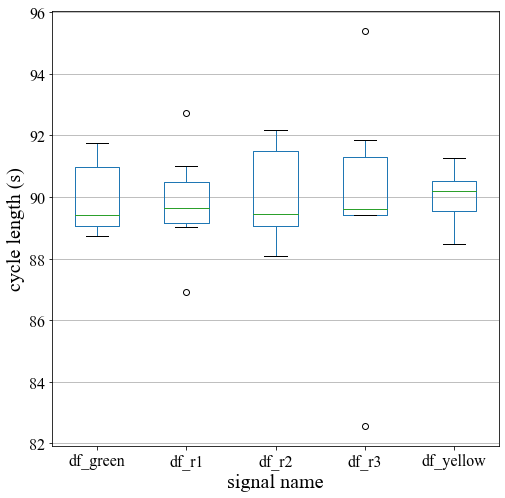

In [41]:
def show_cycle_length(signal_times):
    cycles = {}
    for seg, row in signal_times.iterrows():
        greentimes = row.greentimes
        cycle_length = []
        for i in range(2, len(greentimes) - 3):
            cycle_length.append(greentimes[i + 1] - greentimes[i])
        cycles[seg] = pd.Series(cycle_length)
    cycles = pd.DataFrame(cycles)
    config = {
        "font.family":'Times New Roman',  # 设置字体类型
        "font.size": 10,
    #     "mathtext.fontset":'stix',
    }
    rcParams.update(config)

    fig, ax = plt.subplots(figsize=(8, 8))
    cycles.boxplot(ax=ax, column=signal_times.index.tolist())
    ax.set_ylabel("cycle length (s)", fontdict={"size": 20})
    ax.set_xlabel("signal name", fontdict={"size": 20})
    plt.tick_params(labelsize=16)
    ax.grid(axis="x")
    fig.savefig("signals_cycle_length_boxplot.png", dpi=800)


show_cycle_length(signal_times)

## save signal_time as  pickle file

In [42]:
signal_times.to_pickle("signal_times.pkl")

#  Queue identification and spillback detection

In [43]:
def get_maxqueue(segments, seglength, threshold=5, d_interval=10):
    maxqueue_list = []
    for seg in segments:
        stopline = pd.read_pickle("stopline_f.pkl").set_index("seg")
        stop_a = stopline.loc[seg, 'a']
        stop_b = stopline.loc[seg, 'b']
        signal_times = pd.read_pickle("signal_times.pkl")
        redtimes = signal_times.loc[seg, "redtimes"]
        # df_r1 and df_r2 have spillback and need to be analyzed together with adjacent downstream segments
        if seg == "df_r1":
            df_stop = stopvehciles(pd.concat(
                [pd.read_pickle("df_r1.pkl").query("type!=\'Motorcycle\'"),
                 pd.read_pickle("df_r2.pkl").query("type!=\'Motorcycle\'")], axis=0)
                , 3, 0.04, True, threshold)
            redtimes2 = signal_times.loc["df_r2", "redtimes"]

        elif seg == "df_r2":
            df_stop = stopvehciles(pd.concat(
                [pd.read_pickle("df_r2.pkl").query("type!=\'Motorcycle\'"),
                 pd.read_pickle("df_r3.pkl").query("type!=\'Motorcycle\'")], axis=0)
                , 3, 0.04, True, threshold)
            redtimes2 = signal_times.loc["df_r3", "redtimes"]

        else:
            df_stop = stopvehciles(pd.read_pickle(seg + ".pkl").query("type!=\'Motorcycle\'"),
                                   3, 0.04, True, threshold)

        df_stop["distance_to_stopline"] = df_stop.apply(DistanceBetweenPL, args=(stop_a, stop_b), axis=1)

        if df_stop.distance_to_stopline.mean() > 0:
            df_stop["distance_to_stopline"] = -1 * df_stop["distance_to_stopline"]

        if seg in ["df_r1", "df_r2"]:
            seg_length = seglength.loc[seg, "length"]
            maxqueue_dic = maxqueuelength_red_1_2(df_stop, redtimes, redtimes2, seg_length, d_interval=10)
        else:
            maxqueue_dic = maxqueuelength(df_stop, redtimes)

        maxqueue_dic["seg"] = pd.Series([seg] * (len(redtimes) - 1))
        maxqueue_df = pd.DataFrame(maxqueue_dic)
        maxqueue_list.append(maxqueue_df)

    return pd.concat([queue for queue in maxqueue_list], axis=0)


def maxqueuelength_red_1_2(df_stop, redtimes1, redtimes2, seglength, d_interval=10):
    max_queue = {}
    t_interval = []
    coordinate_of_start = []
    coordinate_of_end = []
    join_time = []
    start_time = []
    queue_start = []
    queue_length = []
    When_spillback = []
    Where_spillback = []

    for i in range(len(redtimes1) - 1):
        t_lower = redtimes1[i]
        t_upper1 = redtimes1[i + 1]
        t_upper2 = redtimes2[i + 1]
        t_upper = max(t_upper1, t_upper2)
        df_stop_cycle = df_stop.query("time >= @t_lower and time<=@t_upper")

        lastveh, when_spillback, where_spillback, firstveh = lastveh_detection_red_1_2(df_stop_cycle, seglength,
                                                                                       t_upper1, t_upper2, 10)

        t_interval.append([t_lower, max(t_upper1, t_upper2)])

        coordinate_of_end.append((lastveh.lat, lastveh.lon))
        join_time.append(lastveh.time)
        queue_length.append(lastveh.distance_to_stopline)

        When_spillback.append(when_spillback)
        Where_spillback.append(where_spillback)

        coordinate_of_start.append((firstveh.lat, firstveh.lon))
        start_time.append(firstveh.time)
        queue_start.append(firstveh.distance_to_stopline)
    max_queue["timeinterval"] = pd.Series(t_interval)
    max_queue["queue_length"] = pd.Series(queue_length)
    max_queue["queue_start"] = pd.Series(queue_start)
    max_queue['max_queue_occur_time'] = pd.Series(join_time)
    max_queue["start_time_of_queue"] = pd.Series(start_time)
    max_queue["coordinte_of_start"] = pd.Series(coordinate_of_start)
    max_queue["coordinate_of_end"] = pd.Series(coordinate_of_end)
    max_queue["When_spillback"] = pd.Series(When_spillback)
    max_queue["Where_spillback"] = pd.Series(Where_spillback)

    return max_queue


def lastveh_detection_red_1_2(df_stop_cycle, seglength, t_upper1, t_upper2, d_interval=10):
    when_spillback, where_spillback = None, None
    dis = df_stop_cycle.distance_to_stopline
    d1 = int(dis.max())
    d2 = -1 * int(seglength + d_interval)
    d_intervalS = [d for d in range(d1, d2, -1 * d_interval)]
    d_intervalS[-1] = -1 * int(seglength)

    stop_time, d_lower, d_upper, firstveh = get_stop_time_and_d_intervalbound(df_stop_cycle, d_intervalS)

    if stop_time[-1] >= t_upper2:
        d_bound = d_lower
        t_lower = stop_time[-1]

    elif stop_time[-1] >= 0:
        t_lower = stop_time[-1]
        df_temp = df_stop_cycle.query("distance_to_stopline >= @d_lower and time <= @t_upper2 and time>=@t_lower ")
        spill_lat = df_temp.iloc[df_temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()].lat
        spill_lon = df_temp.iloc[df_temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()].lon
        where_spillback = (spill_lat, spill_lon)
        when_spillback = df_temp.iloc[df_temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()].time

        df_spillback = df_stop_cycle.query("distance_to_stopline<= @d_lower and time <= @t_upper2 and time >= @t_lower")
        d_bound, t_lower2 = get_bound(df_spillback, d_lower, d_interval)
        if t_lower2:
            t_lower = t_lower2
        t_bound = t_upper2

    elif d_upper - d_lower == d_interval:
        d_bound = d_upper
        t_bound = t_upper1
        t_lower = stop_time[-2]

    else:
        if stop_time[-2] >= t_upper2:
            d_bound = d_upper
            t_bound = t_upper1
            t_lower = stop_time[-2]

        else:
            t_lower = stop_time[-2]
            df_temp = df_stop_cycle.query("distance_to_stopline >= @d_upper and time <= @t_upper2 and time >= @t_lower")
            spill_lat = df_temp.iloc[df_temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()].lat
            spill_lon = df_temp.iloc[df_temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()].lon
            where_spillback = (spill_lat, spill_lon)
            when_spillback = df_temp.iloc[df_temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()].time

            df_spillback = df_stop_cycle.query(
                "distance_to_stopline<= @d_upper and time <= @t_upper2 and time >= @t_lower")
            d_bound, t_lower2 = get_bound(df_spillback, d_upper, d_interval)
            if t_lower2:
                t_lower = t_lower2
            t_bound = t_upper2

    temp = df_stop_cycle.query("distance_to_stopline >= @d_bound and time>=@t_lower")
    lastveh = temp.iloc[temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()]
    return lastveh, when_spillback, where_spillback, firstveh


def maxqueuelength(df_stop, redtimes):
    max_queue = {}
    t_interval = []
    coordinate_of_start = []
    coordinate_of_end = []
    join_time = []
    start_time = []
    queue_start = []
    queue_length = []
    for i in range(len(redtimes) - 1):
        lower = redtimes[i]
        upper = redtimes[i + 1]
        df_stop_cycle = df_stop.query("time > @lower and time < @upper")
        lastveh, firstveh = lastveh_detection(df_stop_cycle, d_interval=10)

        t_interval.append(redtimes[i:i + 2])
        coordinate_of_end.append((lastveh.lat, lastveh.lon))
        join_time.append(lastveh.time)
        queue_length.append(lastveh.distance_to_stopline)

        coordinate_of_start.append((firstveh.lat, firstveh.lon))
        start_time.append(firstveh.time)
        queue_start.append(firstveh.distance_to_stopline)

    max_queue["timeinterval"] = pd.Series(t_interval)
    max_queue["queue_length"] = pd.Series(queue_length)
    max_queue["queue_start"] = pd.Series(queue_start)
    max_queue["coordinte_of_start"] = pd.Series(coordinate_of_start)
    max_queue["coordinate_of_end"] = pd.Series(coordinate_of_end)
    max_queue['max_queue_occur_time'] = pd.Series(join_time)
    max_queue["start_time_of_queue"] = pd.Series(start_time)

    return max_queue


def lastveh_detection(df_stop_cycle, d_interval=10):
    dis = df_stop_cycle.distance_to_stopline
    d1 = int(dis.max()) + 1
    d2 = int(dis.min() - d_interval)
    d_intervalS = [d for d in range(d1, d2, -1 * d_interval)]

    stop_time, d_lower, d_upper, firstveh = get_stop_time_and_d_intervalbound(df_stop_cycle, d_intervalS)

    if stop_time[-1] >= 0:
        d_bound = d_lower
        t_lower = stop_time[-1]
    else:
        d_bound = d_upper
        t_lower = stop_time[-2]

    temp = df_stop_cycle.query("distance_to_stopline >= @d_bound and time>=@t_lower")
    lastveh = temp.iloc[temp.distance_to_stopline.apply(lambda x: abs(x)).argmax()]

    return lastveh, firstveh


def get_stop_time_and_d_intervalbound(df_stop_cycle, d_intervalS):
    stop_time = []
    for i in range(len(d_intervalS) - 1):
        d_lower = d_intervalS[i + 1]
        d_upper = d_intervalS[i]
        if stop_time:
            th = stop_time[-1]
            stop_time.append(df_stop_cycle.query(
                '''distance_to_stopline >= @d_lower and distance_to_stopline <= @d_upper and time > @th ''').time.min())
        else:
            stop_time.append(df_stop_cycle.query(
                '''distance_to_stopline >= @d_lower and distance_to_stopline <= @d_upper''').time.min())
            df_temp = df_stop_cycle.query('''distance_to_stopline >= @d_lower and distance_to_stopline <= @d_upper''')
            try:
                firstveh = df_temp.iloc[df_temp.time.argmin()]
            except:
                firstveh = None
        if not stop_time[-1] >= 0:
            break

    return stop_time, d_lower, d_upper, firstveh


def get_bound(df, d_lower, d_interval):
    d2 = int(df.distance_to_stopline.min() - d_interval)
    d_intervalS = [d for d in range(d_lower, d2, -1 * d_interval)]
    if len(d_intervalS) > 2:
        stop_time, d_lower_bound, d_upper, _ = get_stop_time_and_d_intervalbound(df, d_intervalS)
    else:
        return d_lower, None
    if stop_time[-1] > 0:
        return d_lower_bound, stop_time[-1]
    elif len(stop_time) >= 2:
        return d_upper, stop_time[-2]
    else:
        return d_upper, None

## The length of the segments: r1 and r2

In [44]:
stop_b=[]
stopline = pd.read_pickle("stopline_f.pkl").set_index("seg")
a_r1,b_r1 = stopline.loc["df_r1"]
for seg in ["df_r2","df_r3"]:
    # fiter Motorcycle
    veh = pd.read_pickle(seg+".pkl").query('type != \'Motorcycle\'')
    # get the vehicles in front of the queue
    stop_veh = stopvehciles(veh,10,0.04,False)
    stop_xy_timestamp = stop_veh.iloc[::2].drop_duplicates(['track_id'],keep="last")[['x','y','time']]
    X=stop_xy_timestamp.time.values.reshape(-1,1)
    db= DBSCAN(eps=27,min_samples=3).fit(X)
    labels=db.labels_
    n_cluster = len(set(labels))-(1 if -1 in labels else 0)
    firstvehs_index = []
    for i in range(n_cluster):
        firstvehs_index += stop_xy_timestamp[labels==i][0:2].index.tolist()
    firstvehs = stop_xy_timestamp.loc[[index for index in firstvehs_index]]
    # get stop_b
    stop_ref_b = firstvehs.iloc[0].y-firstvehs.iloc[0].x*a_r1
    dis = firstvehs.apply(DistanceBetweenPL,args=(a_r1,stop_ref_b),axis=1).values
    num,ran = np.histogram(dis,range(int(dis.min()-1),int(dis.max()+5),5))
    dis = dis[dis>ran[num.argmax()]]
    d = (dis[dis<ran[num.argmax()+1]]).mean()
    stop_b.append(stop_ref_b-d*np.sqrt(a_r1**2+1))
    if seg=="df_r2":
        r12_length = abs(stop_b[0]-b_r1)/np.sqrt(a_r1**2+1)
    else:
        r23_length = abs(stop_b[0]-stop_b[1])/np.sqrt(a_r1**2+1)
seglength=pd.DataFrame(index=["df_r1","df_r2"],columns=["length"])
seglength.loc["df_r1","length"]=r12_length
seglength.loc["df_r2","length"]=r23_length
seglength

,length
df_r1,84.674574
df_r2,151.197212


## Queue length identification

In [45]:
segments = ["df_green", "df_yellow", "df_r3", "df_r1", "df_r2"]
queue = get_maxqueue(segments, seglength, threshold=3, d_interval=10)
queue

,timeinterval,queue_length,queue_start,coordinte_of_start,coordinate_of_end,max_queue_occur_time,start_time_of_queue,seg,When_spillback,Where_spillback
0,"[0, 19.96]",0.87,0.64,"(37.991974, 23.731275)","(37.991972, 23.731274)",18.40,18.04,df_green,NaN,NaN
1,"[19.96, 113.92]",-26.94,0.87,"(37.991972, 23.731274)","(37.99221, 23.731411)",70.88,20.00,df_green,NaN,NaN
2,"[113.92, 201.36]",-23.61,-2.27,"(37.991989, 23.731379)","(37.992191, 23.731308)",123.00,113.96,df_green,NaN,NaN
3,"[201.36, 290.96]",-90.02,-0.25,"(37.991983, 23.731267)","(37.992784, 23.731411)",256.40,201.40,df_green,NaN,NaN
4,"[290.96, 380.6]",-86.12,-0.17,"(37.991971, 23.731369)","(37.992736, 23.731524)",358.88,291.00,df_green,NaN,NaN
5,"[380.6, 469.76]",-84.08,1.83,"(37.991953, 23.731367)","(37.992718, 23.731519)",444.00,380.64,df_green,NaN,NaN
6,"[469.76, 559.8]",-47.96,1.10,"(37.991974, 23.731237)","(37.992398, 23.73144)",529.56,469.80,df_green,NaN,NaN
7,"[559.8, 647.44]",-45.17,-1.76,"(37.991988, 23.731346)","(37.992373, 23.731437)",615.40,559.84,df_green,NaN,NaN
8,"[647.44, 714.32]",-51.72,1.05,"(37.991959, 23.731377)","(37.992431, 23.731451)",709.52,647.48,df_green,NaN,NaN
9,"[714.32, 813]",-74.06,-1.80,"(37.992003, 23.731213)","(37.992629, 23.731499)",805.48,714.36,df_green,NaN,NaN


In [46]:
queue.to_pickle("queue.pkl")

## Maximum queue length estimation

In [47]:
segments = ["df_green", "df_yellow", "df_r3", "df_r1", "df_r2"]
start_time = []
Maximum_length = []
queue_start = []
Coordinate_of_end = []
Coordinate_of_start = []
Timestamp_occureence = []
when_spillback = []
where_spillback = []
resultwithnospillback = {}
for seg in segments:
    if seg in ["df_r1", "df_r2"]:
        seg_length = -1 * seglength.loc[seg, "length"] - 5
        temp = queue.query("seg == @seg and queue_length > @seg_length ")
    else:
        temp = queue.query("seg == @seg")
    ind = temp.queue_length.argmin()
    Maximum_length.append(abs(temp.iloc[ind].queue_length))
    Coordinate_of_start.append(temp.iloc[ind].coordinte_of_start)
    Coordinate_of_end.append(temp.iloc[ind].coordinate_of_end)
    Timestamp_occureence.append(temp.iloc[ind].max_queue_occur_time)
    start_time.append(temp.iloc[ind].start_time_of_queue)
    queue_start.append(temp.iloc[ind].queue_start)
resultwithnospillback["seg"] = pd.Series(segments)
resultwithnospillback["Maximum length of queue"] = pd.Series(Maximum_length)
resultwithnospillback["Coordinate of the start of the queue"] = pd.Series(Coordinate_of_start)
resultwithnospillback["Coordinate of the end of the queue"] = pd.Series(Coordinate_of_end)
resultwithnospillback["Timestamp of maximum queue occureence"] = pd.Series(Timestamp_occureence)
resultwithnospillback["start_time_of_queue"] = pd.Series(start_time)
resultwithnospillback["queue_of_start"] = pd.Series(queue_start)

resultwithnospillback = pd.DataFrame(resultwithnospillback)
resultwithnospillback.to_pickle("resultwithnospillback.pkl")
resultwithnospillback

,seg,Maximum length of queue,Coordinate of the start of the queue,Coordinate of the end of the queue,Timestamp of maximum queue occureence,start_time_of_queue,queue_of_start
0,df_green,90.02,"(37.991983, 23.731267)","(37.992784, 23.731411)",256.40,201.40,-0.25
1,df_yellow,61.29,"(37.991566, 23.732094)","(37.991148, 23.731225)",645.44,555.72,3.32
2,df_r3,104.43,"(37.99135, 23.734242)","(37.991166, 23.735387)",726.56,674.64,-1.84
3,df_r1,83.95,"(37.991769, 23.731594)","(37.991648, 23.732532)",764.24,674.36,-0.66
4,df_r2,149.58,"(37.991602, 23.73246)","(37.991324, 23.734194)",117.12,17.16,5.76


In [48]:
Maximum_length = []
queue_start = []
start_time = []
Coordinate_of_end = []
Coordinate_of_start = []
Timestamp_occureence = []
When_spillback = []
Where_spillback = []
resultwithspillback = {}
for seg in ["df_r1", "df_r2"]:
    seg_length = -1 * seglength.loc[seg, "length"] - 5
    temp = queue.query("seg == @seg and queue_length < @seg_length ")
    ind = temp.queue_length.argmin()
    Maximum_length.append(abs(temp.iloc[ind].queue_length))
    Coordinate_of_start.append(temp.iloc[ind].coordinte_of_start)
    Coordinate_of_end.append(temp.iloc[ind].coordinate_of_end)
    Timestamp_occureence.append(temp.iloc[ind].max_queue_occur_time)
    start_time.append(temp.iloc[ind].start_time_of_queue)
    queue_start.append(temp.iloc[ind].queue_start)

resultwithspillback["seg"] = pd.Series(["df_r1", "df_r2"])
resultwithspillback["Maximum length of queue"] = pd.Series(Maximum_length)
resultwithspillback["Coordinate of the start of the queue"] = pd.Series(Coordinate_of_start)
resultwithspillback["Coordinate of the end of the queue"] = pd.Series(Coordinate_of_end)
resultwithspillback["Timestamp of maximum queue occureence"] = pd.Series(Timestamp_occureence)
resultwithspillback["start_time_of_queue"] = pd.Series(start_time)
resultwithspillback["queue_of_start"] = pd.Series(queue_start)
resultwithspillback = pd.DataFrame(resultwithspillback)
resultwithspillback.to_pickle("resultwithspillback.pkl")
resultwithspillback

,seg,Maximum length of queue,Coordinate of the start of the queue,Coordinate of the end of the queue,Timestamp of maximum queue occureence,start_time_of_queue,queue_of_start
0,df_r1,121.76,"(37.99174, 23.731572)","(37.991524, 23.732938)",213.04,135.68,0.51
1,df_r2,232.25,"(37.991586, 23.732551)","(37.991209, 23.735126)",574.08,485.12,-2.43


## spillback detection

In [49]:
When_spillback = []
Where_spillback = []
segments = []
spillback = {}
for seg in ["df_r1", "df_r2"]:
    seg_length = -1 * seglength.loc[seg, "length"] - 5
    temp = queue.query("seg == @seg and queue_length < @seg_length ")
    for ind in range(len(temp)):
        segments.append(seg)
        When_spillback.append(temp.iloc[ind].When_spillback)
        Where_spillback.append(temp.iloc[ind].Where_spillback)

spillback["seg"] = segments
spillback["when a spillback is formed"] = pd.Series(When_spillback)
spillback["where a spillback is formed"] = pd.Series(Where_spillback)

spillback = pd.DataFrame(spillback)
spillback.to_pickle("spillback.pkl")
spillback

,seg,when a spillback is formed,where a spillback is formed
0,df_r1,117.64,"(37.991591, 23.732516)"
1,df_r1,202.64,"(37.991597, 23.732489)"
2,df_r1,288.60,"(37.991596, 23.732477)"
3,df_r1,482.20,"(37.991625, 23.732489)"
4,df_r1,563.04,"(37.991591, 23.732516)"
5,df_r2,297.28,"(37.99138, 23.734226)"
6,df_r2,383.48,"(37.991321, 23.734193)"
7,df_r2,485.56,"(37.991351, 23.734217)"
8,df_r2,576.16,"(37.991319, 23.734209)"
9,df_r2,653.32,"(37.99132, 23.734209)"


## Visualization and validation of maximum queue

### Space time graph for the red area data

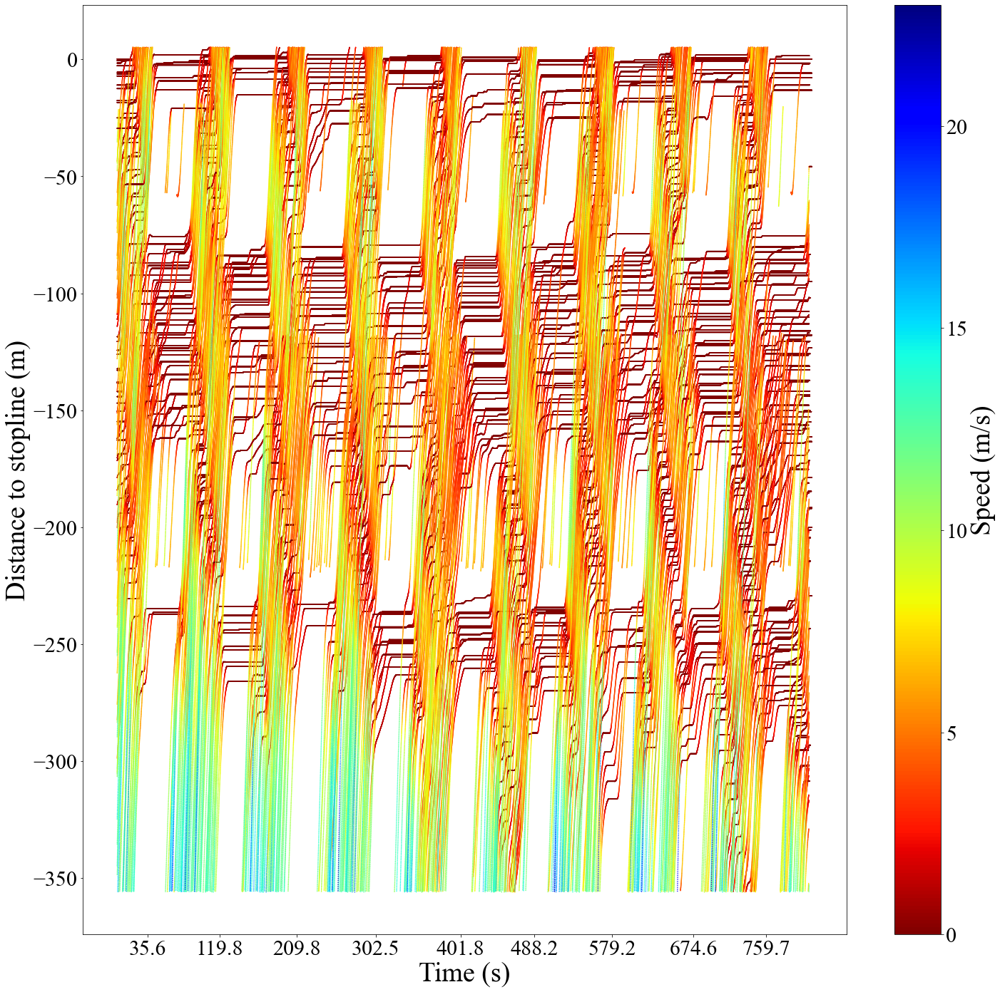

In [50]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
rcParams.update(config)

df_red = pd.read_pickle("df_red.pkl").query("type!='Motorcyle'")
stopline = pd.read_pickle("stopline_f.pkl").set_index("seg")
signal_times = pd.read_pickle("signal_times.pkl")
a = stopline.loc["df_r1", "a"]
b = stopline.loc["df_r1", "b"]
df_red["distance_to_stopline"] = df_red.apply(DistanceBetweenPL, args=(a, b), axis=1)

fig, ax = plt.subplots(figsize=(24, 24))
for track_id in df_red.track_id.unique():
    time = df_red.query("track_id==@track_id").time
    distance = -1 * df_red.query("track_id==@track_id").distance_to_stopline
    v = df_red.query("track_id==@track_id").speed / 3.6
    norm = matplotlib.colors.Normalize(vmin=0, vmax=int(df_red.speed.max() / 3.6 + 1))
    ax = plt.scatter(time, distance, marker=".", s=1, c=v, cmap="jet_r", norm=norm)

plt.xticks(signal_times.loc["df_r3", "redtimes"][1:-1])
plt.tick_params(labelsize=30)
plt.grid(False)
plt.clim(0, int(df_red.speed.max() / 3.6 + 1))
colorbar = plt.colorbar()
colorbar.set_label("Speed (m/s)", fontsize=38)
colorbar.ax.tick_params(labelsize=30)
plt.xlabel("Time (s)", fontsize=38)
plt.ylabel("Distance to stopline (m)", fontsize=38)
fig.savefig("df_red_spacetime.png")

### Maximum queue validation (under no spillback situaion)

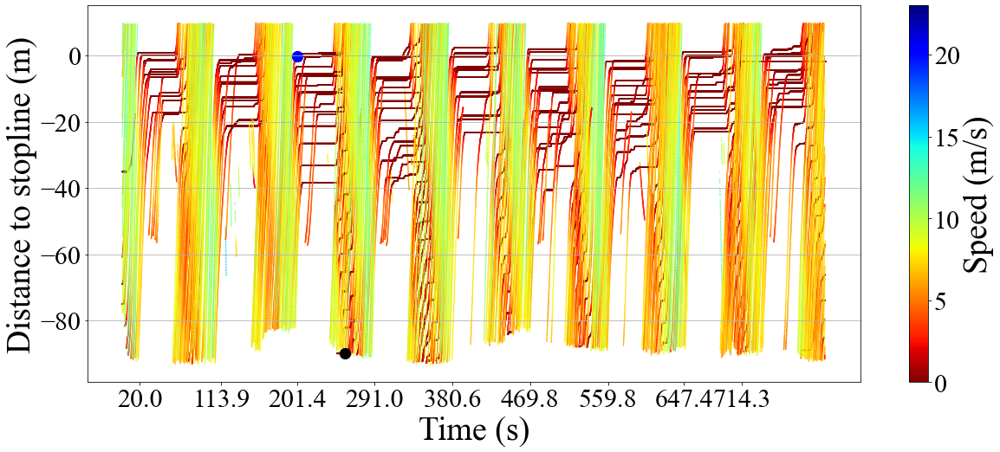

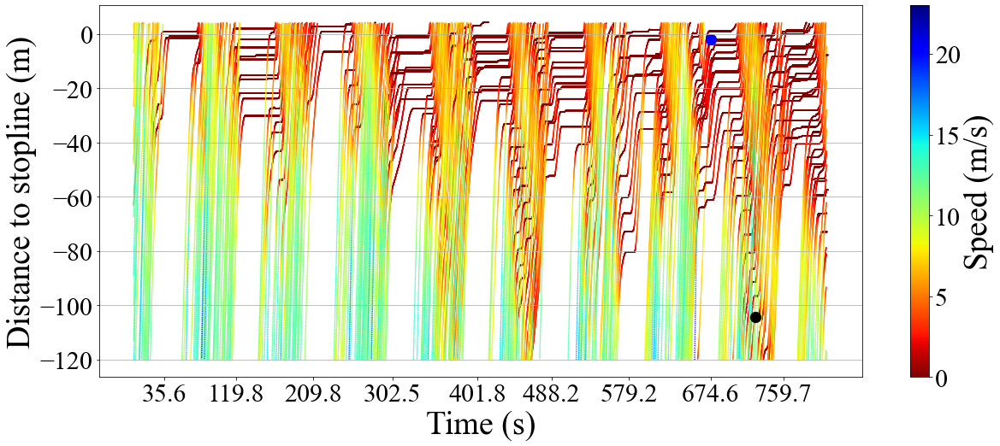

In [51]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
rcParams.update(config)


resultwithnospillback.set_index("seg", inplace=True)
for seg, row in stopline.iterrows():
    if seg in ["df_r1", "df_r2", "df_yellow"]:
        continue
    else:
        result = resultwithnospillback.loc[seg]
        d_start = result["queue_of_start"]
        t_start = result["start_time_of_queue"]
        d_end = -1 * result["Maximum length of queue"]
        t_end = result["Timestamp of maximum queue occureence"]

        df = pd.read_pickle(seg + ".pkl").query("type!='Motorcycle'")
        df["distance_to_stopline"] = df.apply(
            DistanceBetweenPL, args=(row.a, row.b), axis=1
        )
        if df.distance_to_stopline.mean() > 0:
            df["distance_to_stopline"] = -1 * df["distance_to_stopline"]

    fig, ax = plt.subplots(figsize=(20, 8))
    for track_id in df.track_id.unique():
        time = df.query("track_id==@track_id").time
        distance = df.query("track_id==@track_id").distance_to_stopline
        v = df.query("track_id==@track_id").speed / 3.6
        norm = matplotlib.colors.Normalize(vmin=0, vmax=23)
        ax = plt.scatter(time, distance, marker=".", s=1, c=v, cmap="jet_r", norm=norm)

    plt.xticks(signal_times.loc[seg, "redtimes"][1:-1])
    plt.tick_params(labelsize=30)
    plt.grid(axis="y")
    plt.clim(0, 23)
    colorbar = plt.colorbar()
    colorbar.set_label("Speed (m/s)", fontsize=38)
    colorbar.ax.tick_params(labelsize=30)
    ax = plt.scatter(t_start, d_start, s=150, c="b")
    ax = plt.scatter(t_end, d_end, s=150, c="k")
    plt.xlabel("Time (s)", fontsize=38)
    plt.ylabel("Distance to stopline (m)", fontsize=38)
    fig.savefig(seg + "_maximumqueuevalidation.png")

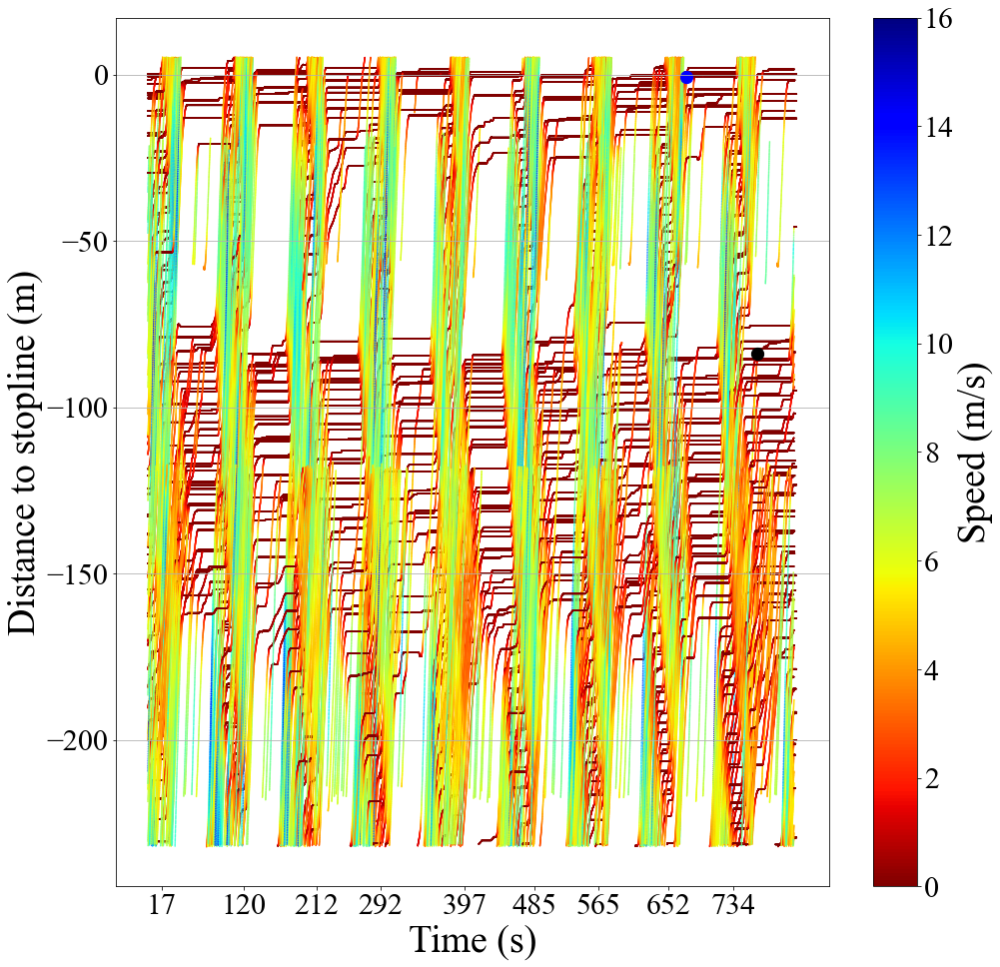

In [52]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
rcParams.update(config)

df_r12 = pd.concat([pd.read_pickle("df_r1.pkl").query("type!='Motorcyle'"),
                    pd.read_pickle("df_r2.pkl").query("type!='Motorcyle'")],axis=0)
df_r12["distance_to_stopline"] = df_r12.apply(DistanceBetweenPL,args=(stopline.loc["df_r1","a"],stopline.loc["df_r1","b"]),axis=1)

result = resultwithnospillback.loc["df_r1"]
d_start = result["queue_of_start"]
t_start = result["start_time_of_queue"]

d_end = -1*result["Maximum length of queue"]
t_end = result["Timestamp of maximum queue occureence"]

fig,ax=plt.subplots(figsize=(16,16))
for track_id in df_r12.track_id.unique():
    time = df_r12.query("track_id==@track_id").time
    distance = -1*df_r12.query("track_id==@track_id").distance_to_stopline
    v = df_r12.query("track_id==@track_id").speed/3.6
    norm = matplotlib.colors.Normalize(vmin=0, vmax=int(df_r12.speed.max()/3.6+1))
    ax = plt.scatter(time,distance,marker = '.',s=1,c=v,cmap="jet_r",norm=norm)


plt.xticks([int(x) for x in signal_times.loc["df_r2","redtimes"][1:-1]])
plt.tick_params(labelsize=30)
plt.grid(axis='y')
plt.clim(0,int(df_r12.speed.max()/3.6+1))
colorbar = plt.colorbar()
colorbar.set_label("Speed (m/s)",fontsize=38)
colorbar.ax.tick_params(labelsize = 30)
ax = plt.scatter(t_start,d_start,s=150,c="b")
ax = plt.scatter(t_end,d_end,s=150,c="k")
plt.xlabel("Time (s)",fontsize=38)
plt.ylabel("Distance to stopline (m)",fontsize=38)
fig.savefig("df_r1_maximumqueuevalidation.png")

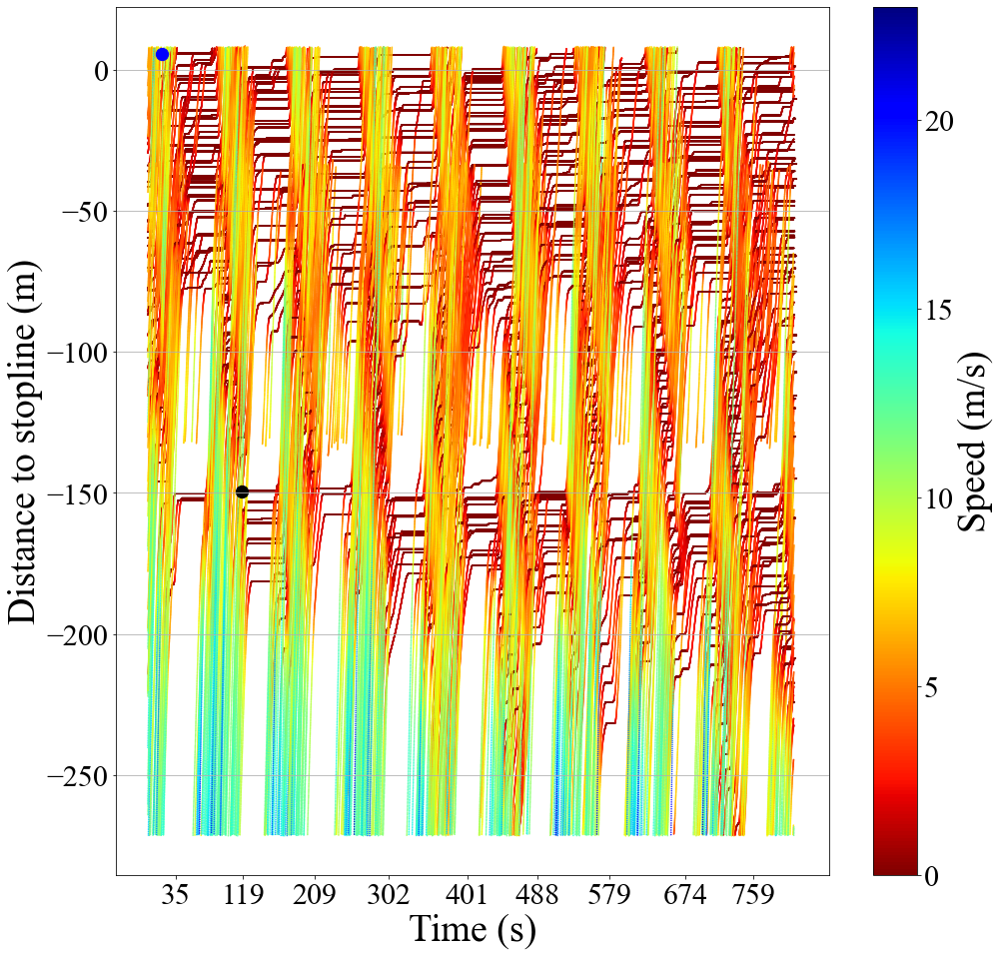

In [53]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
rcParams.update(config)

df_r23 = pd.concat([pd.read_pickle("df_r2.pkl").query("type!='Motorcyle'"),
                    pd.read_pickle("df_r3.pkl").query("type!='Motorcyle'")],axis=0)
df_r23["distance_to_stopline"] = df_r23.apply(DistanceBetweenPL,args=(stopline.loc["df_r2","a"],stopline.loc["df_r2","b"]),axis=1)

result = resultwithnospillback.loc["df_r2"]
d_start = result["queue_of_start"]
t_start = result["start_time_of_queue"]

d_end = -1*result["Maximum length of queue"]
t_end = result["Timestamp of maximum queue occureence"]

fig,ax=plt.subplots(figsize=(16,16))
for track_id in df_r23.track_id.unique():
    time = df_r23.query("track_id==@track_id").time
    distance = -1*df_r23.query("track_id==@track_id").distance_to_stopline
    v = df_r23.query("track_id==@track_id").speed/3.6
    norm = matplotlib.colors.Normalize(vmin=0, vmax=int(df_r23.speed.max()/3.6+1))
    ax = plt.scatter(time,distance,marker = '.',s=1,c=v,cmap="jet_r",norm=norm)

plt.xticks([int(x) for x in signal_times.loc["df_r3","redtimes"][1:-1]])
plt.tick_params(labelsize=30)
plt.grid(axis='y')
plt.clim(0,int(df_r23.speed.max()/3.6+1))
colorbar = plt.colorbar()
colorbar.set_label("Speed (m/s)",fontsize=38)
colorbar.ax.tick_params(labelsize = 30)
ax = plt.scatter(t_start,d_start,s=150,c="b")
ax = plt.scatter(t_end,d_end,s=150,c="k")
plt.xlabel("Time (s)",fontsize=38)
plt.ylabel("Distance to stopline (m)",fontsize=38)
fig.savefig("df_r2_distancetime_vali.png")

### Maximum queue validation at situation of spillback

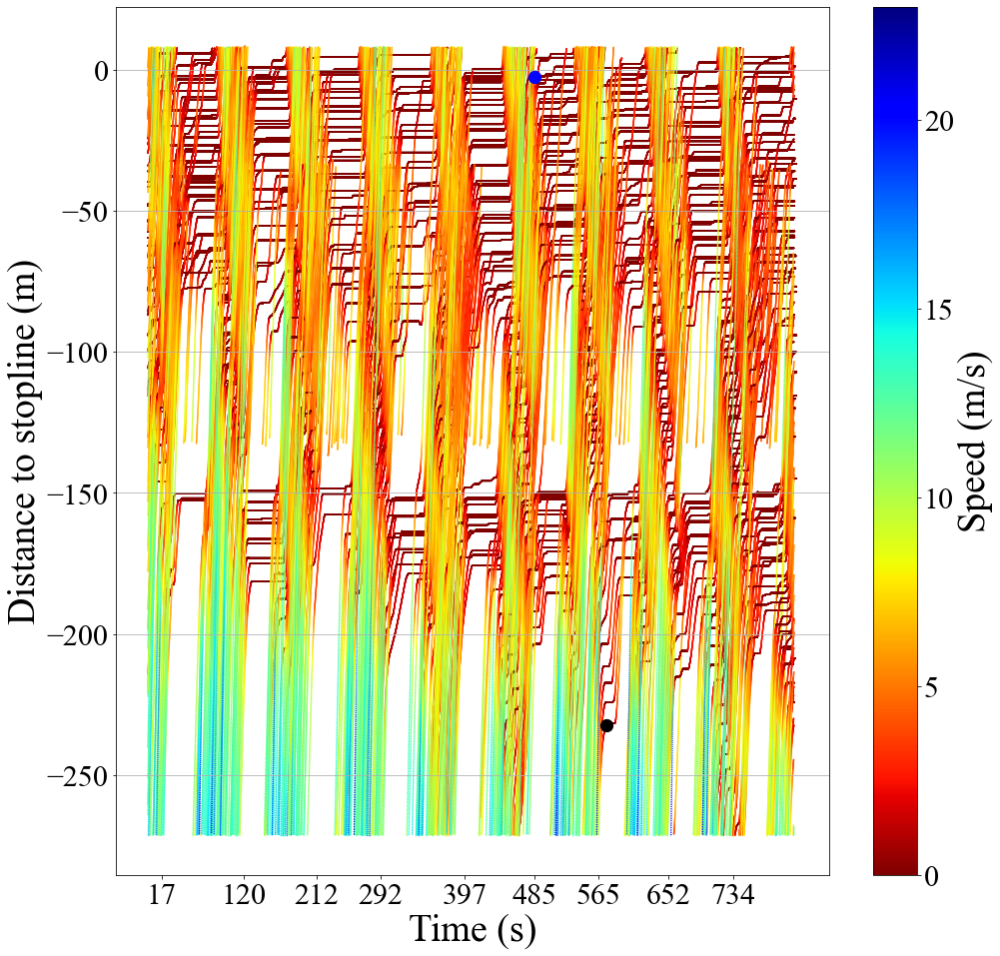

In [54]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
rcParams.update(config)

resultwithspillback.set_index("seg",inplace=True)
result = resultwithspillback.loc["df_r2"]
d_start = result["queue_of_start"]
t_start = result["start_time_of_queue"]

d_end = -1*result["Maximum length of queue"]
t_end = result["Timestamp of maximum queue occureence"]

fig,ax=plt.subplots(figsize=(16,16))
for track_id in df_r23.track_id.unique():
    time = df_r23.query("track_id==@track_id").time
    distance = -1*df_r23.query("track_id==@track_id").distance_to_stopline
    v = df_r23.query("track_id==@track_id").speed/3.6
    norm = matplotlib.colors.Normalize(vmin=0, vmax=int(df_r23.speed.max()/3.6+1))
    ax = plt.scatter(time,distance,marker = '.',s=1,c=v,cmap="jet_r",norm=norm)

plt.xticks([int(x) for x in signal_times.loc["df_r2","redtimes"][1:-1]])
plt.tick_params(labelsize=30)
plt.grid(axis = 'y')
plt.clim(0,int(df_r23.speed.max()/3.6+1))
colorbar = plt.colorbar()
colorbar.set_label("Speed (m/s)",fontsize=38)
colorbar.ax.tick_params(labelsize = 30)
ax = plt.scatter(t_start,d_start,s=150,c="b")
ax = plt.scatter(t_end,d_end,s=150,c="k")
plt.xlabel("Time (s)",fontsize=38)
plt.ylabel("Distance to stopline (m)",fontsize=38)
fig.savefig("df_r2_maximumqueuevalidation_withspillback.png")

### Spillback detection validation

/var/folders/1x/sc60nh0d0sd7gvg4vg6vj7kr0000gn/T/ipykernel_45685/4043873948.py:27: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  colorbar = plt.colorbar()


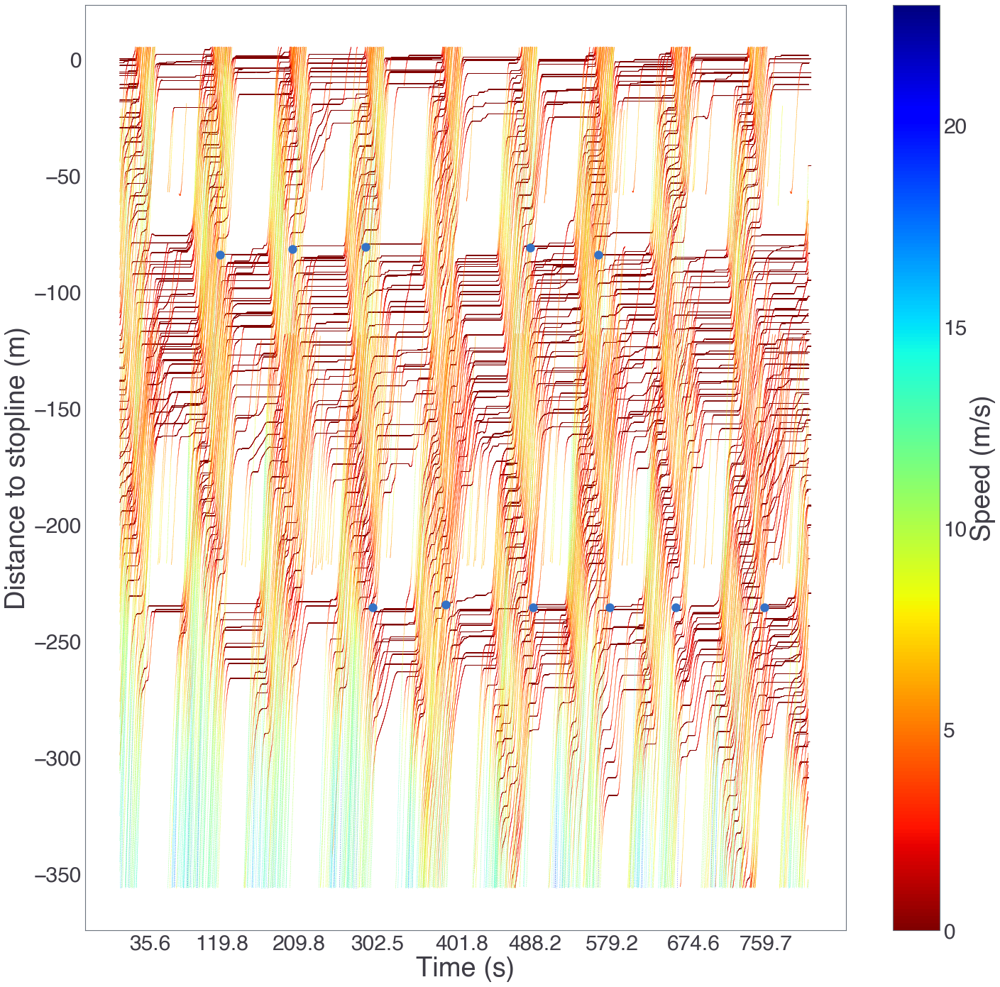

In [55]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
rcParams.update(config)

stopline = pd.read_pickle("stopline_f.pkl").set_index("seg")
signal_times=pd.read_pickle("signal_times.pkl")
a = stopline.loc["df_r1","a"]
b = stopline.loc["df_r1","b"]

from jupyterthemes import jtplot
jtplot.style(theme="grade3")
fig,ax=plt.subplots(figsize=(24,24))
for track_id in df_red.track_id.unique():
    time = df_red.query("track_id==@track_id").time
    distance = -1*df_red.query("track_id==@track_id").distance_to_stopline
    v = df_red.query("track_id==@track_id").speed/3.6
    norm = matplotlib.colors.Normalize(vmin=0, vmax=int(df_red.speed.max()/3.6+1))
    ax = plt.scatter(time,distance,marker = '.',s=1,c=v,cmap="jet_r",norm=norm)

plt.xticks(signal_times.loc["df_r3","redtimes"][1:-1])
plt.tick_params(labelsize=30)
plt.grid(False)
plt.clim(0,int(df_red.speed.max()/3.6+1))
colorbar = plt.colorbar()
colorbar.set_label("Speed (m/s)",fontsize=38)
colorbar.ax.tick_params(labelsize = 30)
for ind,row in spillback.iterrows():
    t = row["when a spillback is formed"]
    lat,lon = row["where a spillback is formed"]
    crs1 = CRS.from_epsg(4326)
    crs2 = CRS.from_epsg(2100)
    transformer = Transformer.from_crs(crs1,crs2)
    x,y = transformer.transform(lat,lon)
    d = -1*(a*x+b-y)/np.sqrt(a**2+1)

    ax = plt.scatter(t,d,s=150,c="b")

plt.xlabel("Time (s)",fontsize=38)
plt.ylabel("Distance to stopline (m)",fontsize=38)
fig.savefig("spillbackformed")

# Vehicle location (lane level)

In [56]:
def get_linesegments(line, n):
    points = MultiPoint([line.interpolate(i / n, normalized=True) for i in range(1, n)])
    return line.difference(points.buffer(1e-13))


def get_stopped(df):
    stopv = df[df["speed"] <= 0.01]
    stopv_m = gpd.GeoDataFrame(stopv, geometry=gpd.points_from_xy(stopv.lon, stopv.lat))
    stopv_m.crs = "EPSG:4326"

    return stopv_m


def extract_intersection(polygonR, number_of_segments):
    roadLineR = LineString([polygonR.exterior.coords[0], polygonR.exterior.coords[3]])
    roadLineR_seg = get_linesegments(roadLineR, number_of_segments)

    perline_C_list = []
    for i in range(len(roadLineR_seg) - 1):
        left = roadLineR_seg[i].parallel_offset(0.01, "left")
        right = roadLineR_seg[i].parallel_offset(0.01, "right")
        c = left.boundary[1]
        d = right.boundary[0]
        perline = LineString([d, c])
        perline_C_list.append(perline)
    perline_C = MultiLineString(perline_C_list)

    pa = []
    perline_C_list.append(polygonR.boundary)
    borders = unary_union(perline_C_list)
    polygons = polygonize(borders)
    for p in polygons:
        pa.append(p)

    pag = gpd.GeoSeries(pa)

    temp = pag[1]
    pag[1] = pag[0]
    pag[0] = temp

    return pag

In [57]:
def solve(m1, m2, std1, std2):
    a = 1 / (2 * std1 ** 2) - 1 / (2 * std2 ** 2)
    b = m2 / (std2 ** 2) - m1 / (std1 ** 2)
    c = m1 ** 2 / (2 * std1 ** 2) - m2 ** 2 / (2 * std2 ** 2) - np.log(std2 / std1)
    return np.roots([a, b, c])


def get_linesegments_etrs(line, n):
    points = MultiPoint([line.interpolate(i / n, normalized=True) for i in range(1, n)])
    return line.difference(points.buffer(1e-9))

In [58]:
def count_number_perlane(M_best, R1_2_gmm):
    # calculate the length of each segment
    laneID = M_best.predict(R1_2_gmm)
    n_lanes = M_best.n_components
    number_perlane = np.zeros(n_lanes)
    for i in range(n_lanes):
        number_perlane[i] = np.count_nonzero(laneID == i)

    return number_perlane

In [59]:
def find_best_number(models, AIC, R1_2_gmm):
    # find the best models index by considering AIC and minimum lane width
    # the optimal number of clusters is the index + 1
    n_aic = np.argmin(AIC)
    for i in range(n_aic, 0, -1):
        lmeans = models[i].means_
        lmeans_s = np.sort(lmeans, axis=0)
        means_min = min(np.diff(lmeans_s, axis=0))
        if means_min > 2.1:
            break
    best_index = i

    # check the number of points in each cluster
    M_best = models[best_index]
    number_perlane = count_number_perlane(M_best, R1_2_gmm)
    if np.amin(number_perlane) < np.sort(number_perlane)[1] * 0.2:
        best_index = best_index - 1

    return best_index

In [60]:
def get_lane_width(df_red, pag1, roadLineR):
    # df_red: dataframe, the full dataset, or dataset of red area or dataset of one intersection
    # pag1: GeoSeries, a segment of the road
    # roadLineR: LineString, road boundary

    stopv_m = df_red  # df_concat_m
    # pag1 = pag[0] # for debuging
    points_red_seg = stopv_m["geometry"].within(pag1)
    stopv_m_pagR1 = stopv_m[points_red_seg]

    stopv_m_pagR1_proj = stopv_m_pagR1.copy()
    stopv_m_pagR1_proj["geometry"] = stopv_m_pagR1_proj["geometry"].to_crs("EPSG:3035")

    roadLineR_geo = gpd.GeoSeries([roadLineR])
    roadLineR_geo.crs = "EPSG:4326"
    roadLineR_geo = roadLineR_geo.to_crs("EPSG:3035")

    # remove the repeated data for stopping vehicles
    # stopv_m_pagR1_proj_u = stopv_m_pagR1_proj.drop_duplicates(
    #     subset=['track_id', 'geometry'])
    # do not consider the motorcycle in the process of estimating lane widths
    stopv_m_pagR1_proj_u_NM = stopv_m_pagR1_proj[
        stopv_m_pagR1_proj["type"] != "Motorcycle"
    ]

    stopv_m_pagR1_dis_u_NM = stopv_m_pagR1_proj_u_NM.geometry.apply(
        lambda x: roadLineR_geo.distance(x)
    )
    stopv_m_pagR1_dis_u_pd_NM = pd.DataFrame(stopv_m_pagR1_dis_u_NM)

    R1_2_gmm = stopv_m_pagR1_dis_u_pd_NM[0].to_numpy()
    R1_2_gmm = R1_2_gmm.reshape(-1, 1)

    # fit models with 1-7 components
    N = np.arange(1, 8)
    X = R1_2_gmm
    models = [None for i in range(len(N))]

    for i in range(len(N)):
        models[i] = mixture.GaussianMixture(N[i]).fit(R1_2_gmm)

    # compute the AIC and the BIC
    AIC = [m.aic(X) for m in models]
    BIC = [m.bic(X) for m in models]

    best_index = find_best_number(models, AIC, R1_2_gmm)
    M_best = models[best_index]
    N_best = best_index + 1
    lmeans = M_best.means_
    lcov = M_best.covariances_.reshape((N_best, 1))
    lstd = np.sqrt(lcov)
    lmcon = np.concatenate((lmeans, lcov, lstd), axis=1)
    lmcon = lmcon[lmcon[:, 0].argsort()]

    laneID_new = get_lane_ID(M_best, R1_2_gmm, lmcon)

    df_lane = store_laneID(stopv_m_pagR1_proj_u_NM, laneID_new)

    lane = calculate_lane_width(lmcon, N_best)

    return N_best, lane, df_lane

In [61]:
def calculate_lane_width(lmcon, N_best):
    lane = np.zeros((N_best - 1, 1))
    for i in range(N_best - 1):
        result = solve(lmcon[i, 0], lmcon[i + 1, 0], lmcon[i, 2], lmcon[i + 1, 2])
        result_and = np.logical_and(result > lmcon[i, 0], result < lmcon[i + 1, 0])
        if np.any(result_and) > 0:
            if max(result) > 0:
                lane[i] = result[result_and]
            else:
                lane[i] = lmcon[i, 1] + (
                    lmcon[i + 1, 0] - lmcon[i, 1]
                ) * lmcon[i + 1, 2] / (lmcon[i, 2] + lmcon[i + 1, 2])

    return lane

In [62]:
def store_laneID(df_geo, laneID_new):
    # stopv_m_pagR1_proj_u_NM
    if df_geo["geometry"].crs == "EPSG:3035":
        df_geo["geometry"] = df_geo["geometry"].to_crs("EPSG:4326")
    df_geo_lane = df_geo.copy()
    df_geo_lane.loc[:, "laneID"] = laneID_new
    return df_geo_lane

In [63]:
def reassign_groupID(M_best, lmcon):
    laneID_gmm = M_best.predict(np.array(lmcon[:, 0]).reshape(-1, 1))
    laneID_new = np.array(np.arange(1, M_best.n_components + 1))
    reassign = dict(zip(laneID_gmm, laneID_new))

    return reassign

In [64]:
def get_lane_ID(M_best, R1_2_gmm, lmcon):
    # get the lane ID from GMM
    laneID = M_best.predict(R1_2_gmm)
    reassign = reassign_groupID(M_best, lmcon)
    sort_idx = np.argsort(list(reassign.keys()))
    idx = np.searchsorted(list(reassign.keys()), laneID, sorter=sort_idx)
    laneID_new = np.asarray(list(reassign.values()))[sort_idx][idx]
    laneID_new = laneID_new.reshape(-1, 1)

    return laneID_new

In [65]:
def get_lane_info(pag, df_red, roadLineR):
    lanes = []
    df_point_lane = pd.DataFrame()
    number_segs = len(pag)
    n_lanes = np.zeros(number_segs)
    for i in range(number_segs):
        n_lane, lane, df_lane = get_lane_width(df_red, pag[i], roadLineR)
        n_lanes[i] = n_lane
        lanes.append(lane)
        df_point_lane = pd.concat([df_point_lane, df_lane])
    n_lanes = n_lanes.astype(int)

    return df_point_lane, lanes, n_lanes

In [66]:
def find_max_queue_lane_ID(maxq_lon, maxq_lat, df_point_lane):
    # find the laneID for a point that represents the max queue length
    # maxq_lon: the longitude
    maxq_laneID = df_point_lane[(df_point_lane['lon'] == maxq_lon) & (df_point_lane['lat'] == maxq_lat)]['laneID'].unique()
    if len(maxq_laneID) == 1:
        return maxq_laneID[0]
    else:
        raise Warning("Multiple lanes are found for the point!")

/Users/ove/opt/anaconda3/envs/Results-master/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/ove/opt/anaconda3/envs/Results-master/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/ove/opt/anaconda3/envs/Results-master/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is tryin

df_point_lane_R:          track_id type  traveled_d  avg_speed        lat        lon    speed  \
132691         87  Car      138.83  12.072509  37.991740  23.731584   0.0000   
132692         87  Car      138.83  12.072509  37.991740  23.731584   0.0000   
132693         87  Car      138.83  12.072509  37.991740  23.731584   0.0000   
132694         87  Car      138.83  12.072509  37.991740  23.731584   0.0000   
132695         87  Car      138.83  12.072509  37.991740  23.731584   0.0000   
...           ...  ...         ...        ...        ...        ...      ...   
6320702      2282  Car       85.87  45.461608  37.991113  23.735544  44.0120   
6320703      2282  Car       85.87  45.461608  37.991114  23.735538  43.9658   
6320704      2282  Car       85.87  45.461608  37.991115  23.735533  43.9240   
6320705      2282  Car       85.87  45.461608  37.991116  23.735528  43.8879   
6320706      2282  Car       85.87  45.461608  37.991116  23.735522  43.8609   

         lon_acc  lat_

/Users/ove/opt/anaconda3/envs/Results-master/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/ove/opt/anaconda3/envs/Results-master/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/ove/opt/anaconda3/envs/Results-master/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is tryin

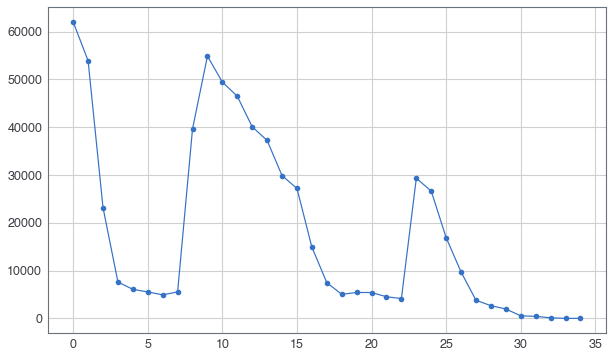

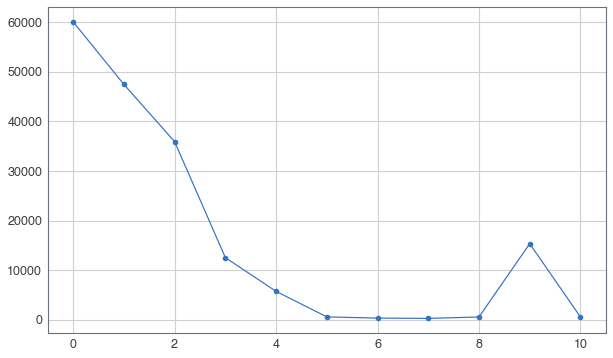

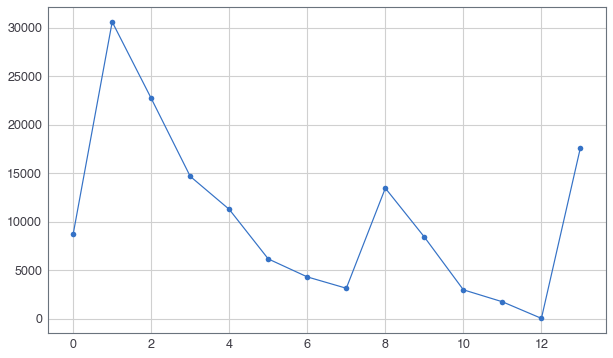

In [75]:
###### main
polygonR = Polygon(
    [
        (23.731513, 37.991733),
        (23.731551, 37.991848),
        (23.735570, 37.991181),
        (23.735552, 37.991085),
    ]
)
polygonY = Polygon([(23.732146, 37.991627),
                    (23.732113, 37.991508), (23.731443, 37.991330),
                    (23.731318, 37.991226), (23.731292, 37.991123),
                    (23.731146, 37.991142), (23.731364, 37.991468),
                    (23.731791, 37.991686)
                    ])
polygonG = Polygon(
    [
        (23.731395, 37.991880),
        (23.731179, 37.991899),
        (23.731424, 37.992846),
        (23.731588, 37.992813),
    ]
)

df_red = pd.read_pickle("df_red.pkl")
pag_R = extract_intersection(polygonR, 35)
show_stops_segment(df_red, pag_R)
roadLineR = LineString([pag_R[0].exterior.coords[2], pag_R[34].exterior.coords[3]])
df_point_lane_R, lanes, n_lanes = get_lane_info(pag_R, df_red, roadLineR)
print("df_point_lane_R:", df_point_lane_R)
print("lanes", lanes)
print("n_lanes", n_lanes)


df_green = pd.read_pickle("df_green.pkl")
pag_G = extract_intersection(polygonG, 11)
show_stops_segment(df_green, pag_G)

roadLineR = LineString([polygonG.exterior.coords[0], polygonG.exterior.coords[3]])
df_point_lane_G, lanes, n_lanes = get_lane_info(pag_G, df_green, roadLineR)

df_yellow = pd.read_pickle("df_yellow.pkl")
pag_Y = extract_intersection(polygonY, 14)
show_stops_segment(df_yellow, pag_Y)
roadLineY = LineString(
    [
        polygonY.exterior.coords[0],
        polygonY.exterior.coords[7],
        polygonY.exterior.coords[6],
        polygonY.exterior.coords[5],
    ]
)
df_point_lane_Y, lanes, n_lanes = get_lane_info(pag_Y, df_yellow, roadLineY)

In [68]:
#### need input of (maxq_lon, maxq_lat)
maxq_laneIDs_withnospillback={}

resultwithnospillback = pd.read_pickle("resultwithnospillback.pkl").set_index("seg")
for seg, row in resultwithnospillback.iterrows():
    lat,lon = row["Coordinate of the end of the queue"]
    if "df_r" in seg:
        maxq_laneID = find_max_queue_lane_ID(lon, lat, df_point_lane_R)
        maxq_laneIDs_withnospillback[seg] = maxq_laneID
    elif seg == "df_green":
        maxq_laneID = find_max_queue_lane_ID(lon, lat, df_point_lane_G)
        maxq_laneIDs_withnospillback[seg] = maxq_laneID
    else:
        maxq_laneID = find_max_queue_lane_ID(lon, lat, df_point_lane_Y)
        maxq_laneIDs_withnospillback[seg] = maxq_laneID


maxq_laneIDs_withnospillback

{'df_green': 4, 'df_yellow': 2, 'df_r3': 2, 'df_r1': 3, 'df_r2': 1}

In [69]:
#### need input of (maxq_lon, maxq_lat)
maxq_laneIDs_withspillback={}
resultwithspillback = pd.read_pickle("resultwithspillback.pkl").set_index("seg")
for seg, row in resultwithspillback.iterrows():
    lat,lon = row["Coordinate of the end of the queue"]
    if "df_r" in seg:
        maxq_laneID = find_max_queue_lane_ID(lon, lat, df_point_lane_R)
        maxq_laneIDs_withspillback[seg] = maxq_laneID
    elif seg == "df_green":
        maxq_laneID = find_max_queue_lane_ID(lon, lat, df_point_lane_G)
        maxq_laneIDs_withspillback[seg] = maxq_laneID

maxq_laneIDs_withspillback

{'df_r1': 1, 'df_r2': 2}

# shockWave identification

In [2]:
strlist_former = ['']
result = []

csv.field_size_limit(500 * 1024 * 1024)

val =  [' Car', ' Taxi', ' Bus', ' Medium Vehicle', ' Heavy Vehicle', ' Motorcycle']

# 打开数据库文件
with open('competition_dataset.csv', encoding="utf-8") as f:
    reader = csv.DictReader(f)
    j = 1
    for line in reader:
        temp = str(line.values()).split("'")[1].split(';')# 用逗号分割str字符串，并保存到列表
        if j == 1:
            break
    j = 2
    for line in reader:
        strlist = str(line.values()).split("'")[1].split(';')# 用逗号分割str字符串，并保存到列表
        if strlist[1] not in val:#合并同一track_id的不同行
            strlist_former = str(strlist_former).split("']")[0] + str(temp).split("['")[1]
        else:
            if strlist_former != ['']:
                temp = str(strlist_former).split("']")[0] + str(temp).split("['")[1]
                strlist_former = ['']
                temp = temp.split("['")[1].split("', '")
            else:
                del(temp[-1])
            result.append(temp[0:10])
            for t in range(0,int((len(temp)-4)/6)-1):
                result.append(temp[0:4]+temp[10+t*6:16+t*6])
            j = j + 1
        temp = strlist
        if j == 2308:
            break

In [3]:
column=['track_id','type', 'traveled_d', 'avg_speed', 'lat', 'lon', 'speed', 'lon_acc', 'lat_acc', 'time'] # 列表对应每列的列名
test=pd.DataFrame(columns=column,data=result)
test.loc[test['type'] == ' Car','type'] = 1
test.loc[test['type'] == ' Taxi','type'] = 2
test.loc[test['type'] == ' Bus','type'] = 3
test.loc[test['type'] == ' Medium Vehicle','type'] = 4
test.loc[test['type'] == ' Heavy Vehicle','type'] = 5
test.loc[test['type'] == ' Motorcycle','type'] = 6
test = test.loc[:].astype(float)

In [82]:
# #area 1
# test1 = test.drop(index=(test.loc[(test['lon']<=23.7315)].index))
# test1 = test1.drop(index=(test1.loc[(test1['lon']>=23.7356)].index))
# test1 = test1.drop(index=(test1.loc[(test1['lat']<=37.99107)].index))
# test1 = test1.drop(index=(test1.loc[(test1['lat']>=37.9919)].index))
# test1 = test1.drop(index=(test1.loc[(test1['lon']*(-0.1647)+41.90031>=test1['lat'])].index))
# test1 = test1.drop(index=(test1.loc[(test1['lon']*(-0.1647)+41.900425<test1['lat'])].index))

In [84]:
# # testArea bottom
# test4 = test1.drop(index=(test1.loc[(test1['lon']*(-0.1647)+41.90039>=test1['lat'])].index))
# test4 = test4.drop(index=(test4.loc[(test4['time']>=800)].index))
# test4 = test4.drop(index=(test4.loc[(test4['time']<=700)].index))
# # testArea middle
# test5 = test1.drop(index=(test1.loc[(test1['lon']*(-0.1647)+41.90036>=test1['lat'])].index))
# test5 = test5.drop(index=(test5.loc[(test5['lon']*(-0.1647)+41.90039<test5['lat'])].index))
# test5 = test5.drop(index=(test5.loc[(test5['time']>=800)].index))
# test5 = test5.drop(index=(test5.loc[(test5['time']<=700)].index))
# # testArea under
# test6 = test1.drop(index=(test1.loc[(test1['lon']*(-0.1647)+41.90033>=test1['lat'])].index))
# test6 = test6.drop(index=(test6.loc[(test6['lon']*(-0.1647)+41.90036<test6['lat'])].index))
# test6 = test6.drop(index=(test6.loc[(test6['time']>=800)].index))
# test6 = test6.drop(index=(test6.loc[(test6['time']<=700)].index))

In [87]:
polygonR = Polygon(
    [
        (23.731513, 37.991733),
        (23.731551, 37.991848),
        (23.735570, 37.991181),
        (23.735552, 37.991085),
    ]
)
polygonY = Polygon([(23.732146, 37.991627),
                    (23.732113, 37.991508), (23.731443, 37.991330),
                    (23.731318, 37.991226), (23.731292, 37.991123),
                    (23.731146, 37.991142), (23.731364, 37.991468),
                    (23.731791, 37.991686)
                    ])
polygonG = Polygon(
    [
        (23.731395, 37.991880),
        (23.731179, 37.991899),
        (23.731424, 37.992846),
        (23.731588, 37.992813),
    ]
)

In [4]:
#area 1
test1 = test.drop(index=test.loc[(test['lon'] <= 23.731513)].index)
test1 = test1.drop(index=test1.loc[(test1['lon'] >= 23.735552)].index)
test1 = test1.drop(index=test1.loc[(test1['lat'] <= 37.99107)].index)
test1 = test1.drop(index=test1.loc[(test1['lat'] >= 37.9919)].index)
test1 = test1.drop(index=test1.loc[(test1['lon'] * (-0.1647) + 41.90031 >= test1['lat'])].index)
test1 = test1.drop(index=test1.loc[(test1['lon'] * (-0.1647) + 41.900425 < test1['lat'])].index)

In [5]:
# testArea bottom
test4 = test1.drop(index=test1.loc[(test1['lon'] * (-0.1647) + 41.90039 >= test1['lat'])].index)
test4 = test4.drop(index=test4.loc[(test4['time'] >= 450)].index)
test4 = test4.drop(index=test4.loc[(test4['time'] <= 400)].index)
# testArea middle
test5 = test1.drop(index=test1.loc[(test1['lon'] * (-0.1647) + 41.90036 >= test1['lat'])].index)
test5 = test5.drop(index=test5.loc[(test5['lon'] * (-0.1647) + 41.90039 < test5['lat'])].index)
test5 = test5.drop(index=test5.loc[(test5['time'] >= 450)].index)
test5 = test5.drop(index=test5.loc[(test5['time'] <= 400)].index)
# testArea under
test6 = test1.drop(index=test1.loc[(test1['lon'] * (-0.1647) + 41.90033 >= test1['lat'])].index)
test6 = test6.drop(index=test6.loc[(test6['lon'] * (-0.1647) + 41.90036 < test6['lat'])].index)
test6 = test6.drop(index=test6.loc[(test6['time'] >= 450)].index)
test6 = test6.drop(index=test6.loc[(test6['time'] <= 400)].index)

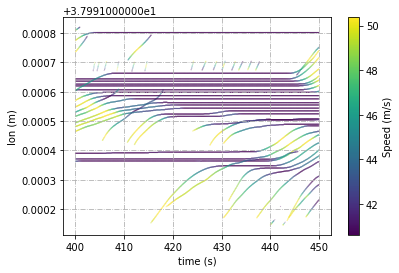

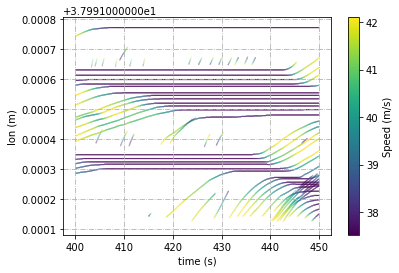

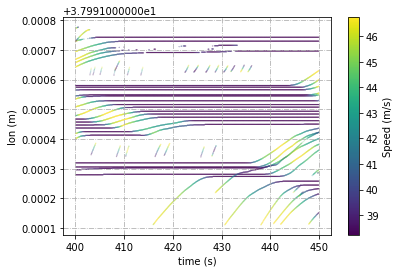

In [6]:
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size": 10,
#     "mathtext.fontset":'stix',
}
# rcParams.update(config)
# ps0 = dict(list(test.groupby(['track_id'])))
# plt.grid(linestyle='-.')
# for i in ps0.keys():
#     temp = ps0.get(i)
#     #plt.scatter(temp['lon'], temp['lat'], c=temp['speed'], s=0.01)
#     plt.scatter(temp['time'], temp['lat'], c=temp['speed'], s=0.01)
# plt.colorbar(label="Speed (m/s)")
# plt.xlabel('time (s)')
# plt.ylabel('lon (m)')
# plt.savefig('./temporalSpatialLocal3.jpg', dpi=1200)
# plt.show()

ps = dict(list(test4.groupby(['track_id'])))
plt.grid(linestyle='-.')
for i in ps.keys():
    temp = ps.get(i)
    #plt.scatter(temp['lon'], temp['lat'], c=temp['speed'], s=0.01)
    plt.scatter(temp['time'], temp['lat'], c=temp['speed'], s=0.01)
plt.colorbar(label="Speed (m/s)")
plt.xlabel('time (s)')
plt.ylabel('lon (m)')
plt.savefig('./temporalSpatialLocal1.jpg', dpi=1200)
plt.show()

ps2 = dict(list(test5.groupby(['track_id'])))
plt.grid(linestyle='-.')
for i in ps2.keys():
    temp = ps2.get(i)
    #plt.scatter(temp['lon'], temp['lat'], c=temp['speed'], s=0.01)
    plt.scatter(temp['time'], temp['lat'], c=temp['speed'], s=0.01)
plt.colorbar(label="Speed (m/s)")
plt.xlabel('time (s)')
plt.ylabel('lon (m)')
plt.savefig('./temporalSpatialLocal2.jpg', dpi=1200)
plt.show()

ps3 = dict(list(test6.groupby(['track_id'])))
plt.grid(linestyle='-.')
for i in ps3.keys():
    temp = ps3.get(i)
    #plt.scatter(temp['lon'], temp['lat'], c=temp['speed'], s=0.01)
    plt.scatter(temp['time'], temp['lat'], c=temp['speed'], s=0.01)
plt.colorbar(label="Speed (m/s)")
plt.xlabel('time (s)')
plt.ylabel('lon (m)')
plt.savefig('./temporalSpatialLocal3.jpg', dpi=1200)
plt.show()